<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.875 · Deep Learning · PEC1</p>
<p style="margin: 0; text-align:right;">2022-2 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PEC 1: Redes neuronales artificiales y convolucionales con Keras

A lo largo de esta práctica vamos a implementar varios modelos de redes neuronales para clasificar las imágenes de una base de datos de imágenes satelitales. En concreto:
- Se implementará una red completamente conectada para establecer un modelo de referencia o <i>baseline</i>
- Se implementará una red convolucional
- Se implementará un autoencoder
- Se implementará una red convolucional profunda a partir de un modelo conocido (VGG16) pre-entrenado en Imagenet utilizando <i>transfer-learning</i>

<u>Consideraciones generales</u>: 

- La solución planteada no puede utilizar métodos, funciones o parámetros declarados **_deprecated_** en futuras versiones, a excepción de la carga de datos cómo se indica posteriormente.
- Esta PEC debe realizarse de forma **estrictamente individual**. Cualquier indicio de copia será penalizado con un suspenso (D) para todas las partes implicadas y la posible evaluación negativa de la asignatura de forma íntegra.
- Es necesario que el estudiante indique **todas las fuentes** que ha utilizado para la realización de la PEC. De no ser así, se considerará que el estudiante ha cometido plagio, siendo penalizado con un suspenso (D) y la posible evaluación negativa de la asignatura de forma íntegra.

<u>Formato de la entrega</u>:

- Algunos ejercicios pueden suponer varios minutos de ejecución, por lo que la entrega debe hacerse en **formato notebook** y en **formato html**, donde se vea el código, los resultados y comentarios de cada ejercicio. Se puede exportar el notebook a HTML desde el menú File $\to$ Download as $\to$ HTML.
- Existe un tipo de celda especial para albergar texto. Este tipo de celda os será muy útil para responder a las diferentes preguntas teóricas planteadas a lo largo de la actividad. Para cambiar el tipo de celda a este tipo, en el menú: Cell $\to$ Cell Type $\to$ Markdown.

## 0. Contexto y carga de librerías
Las imágenes tomadas por satélite son clave en la supervisión del uso y la cobertura del suelo, cuestiones relevantes para la gestión ambiental, la planificación urbana, la sostenibilidad y para combatir el cambio climático.

En esta práctica, trabajaremos con la base de datos [UC Merced Land Use Data](http://weegee.vision.ucmerced.edu/datasets/landuse.html), que consiste en imágenes satelitales de 256x256 píxeles de 21 escenas diferentes: las clases son diversas, conteniendo escenas e imágenes de aviones o ríos, entre otras categorías.

Concretamente trabajaremos con una versión aumentada de dicha base de datos que está disponible en un [repositorio de Kaggle](https://www.kaggle.com/datasets/apollo2506/landuse-scene-classification). En esta versión se han llevado a cabo varios procesos de aumentación de datos de tal forma que el número de imágenes por clase pasa de 100 a 500.

**Nota: Se recomienda realizar la práctica en el entorno que ofrece la plataforma Kaggle, ya que ofrece un entorno gratuito con 30 horas semanales de uso de GPU.**

A lo largo de toda la práctica, para la creación de las distintas redes, iremos alternando el uso del modelo [Sequential](https://keras.io/guides/sequential_model/) y el modelo [Functional](https://keras.io/guides/functional_api/) de Keras a través de las clases [Sequential](https://keras.io/api/models/sequential/) y [Model](https://keras.io/api/models/model/) respectivamente.

Empezamos cargando las librerías mas relevantes:

In [2]:
# Importamos tensorflow
import tensorflow as tf
print("TF version   : ", tf.__version__)

# Necesitaremos GPU
print("GPU available: ", tf.config.list_physical_devices('GPU'))

# keras version is 2.11.0
import keras
print("Keras version   : ", keras.__version__)

TF version   :  2.11.0
GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Keras version   :  2.11.0


In [3]:
# Importamos los elementos de keras que utilizaremos con mayor frecuencia
from keras.utils import image_dataset_from_directory
from keras.layers import (
    GlobalAveragePooling2D, Flatten, Input,
    Dense, Dropout, Conv2D, Conv2DTranspose, BatchNormalization, 
    MaxPooling2D, UpSampling2D, Rescaling, Resizing)
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from keras import Sequential, Model
from tensorflow.keras import layers

In [4]:
# Importamos el resto de librerías que necesitaremos para la PEC
import cv2
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time

## 1. Descarga, análisis y pre-procesado de los datos (1,5 puntos)

En este apartado exploraremos la base de datos y prepararemos la carga de las imágenes para los modelos de los siguientes apartados.

Para la descarga de la base de datos tenemos 2 opciones dependiendo de si decidimos trabajar en local o desde el entorno de Kaggle:
- Si trabajamos en local debemos descargar la base de datos desde el siguiente [enlace](https://www.kaggle.com/datasets/apollo2506/landuse-scene-classification/download?datasetVersionNumber=3) (es un archivo .zip que ocupa 2 GB) y descomprimirlo.
- Si trabajamos desde Kaggle. Debemos subir el Notebook del enunciado a la plataforma (para ello podéis seguir los 6 primeros pasos del siguiente [artículo](https://rajputankit22.medium.com/how-to-upload-my-own-notebook-to-kaggle-2b0dedbb5a6b)) y después, una vez subido el notebook, clickar el botón '+ Add Data' y en la caja de búsqueda introducir la dirección 'https://www.kaggle.com/datasets/apollo2506/landuse-scene-classification'. Una vez encontrado el dataset darle al botón '+' (Add Dataset), y desde ese momento ya tendréis accesible la base de datos en la ruta <code>../input/</code>.

Una vez tenemos la base de datos accesible vamos a inspeccionarla.

Las imágenes se encuentran agrupadas de 2 formas diferentes:
- En la carpeta <code>/landuse-scene-classification/images/</code> se encuentra el total de las imágenes separadas por clases (cada clase en una carpeta distinta). Pero no se ha realizado una separación en conjunto de entrenamiento y test (o entrenamiento, validación y test).
- En la carpeta <code>/landuse-scene-classification/images_train_test_val/</code> se encuentran 3 carpetas (<code>test</code>, <code>train</code> y <code>validation</code>) en las que el total de imágenes se ha separado de forma aleatoria. En cada una de las 3 carpetas, tenemos imágenes de las 21 clases agrupadas en sus correspondientes carpetas. En la carpeta raíz <code>/landuse-scene-classification/</code> tenemos 3 archivos .csv con la distribución de cada carpeta.

En esta práctica utilizaremos el dataset ya particionado, es decir, trabajaremos con las imágenes que se encuentran en la ruta <code>/landuse-scene-classification/images_train_test_val/</code>.

### 1.1. Análisis de los archivos .csv

A partir de los archivos .csv podemos ver cómo se han distribuído los datos. Por ejemplo:

In [29]:
train = pd.read_csv('../input/landuse-scene-classification/train.csv')
train.head(5)

,Unnamed: 0,Filename,Label,ClassName
0,5818,runway/runway_000259.png,16,runway
1,1327,intersection/intersection_000348.png,10,intersection
2,2529,agricultural/agricultural_000025.png,0,agricultural
3,3865,chaparral/chaparral_000195.png,5,chaparral
4,2024,airplane/airplane_000260.png,1,airplane


In [30]:
test = pd.read_csv('../input/landuse-scene-classification/test.csv')
test.head(5)

,Unnamed: 0,Filename,Label,ClassName
0,311,river/river_000149.png,15,river
1,975,mediumresidential/mediumresidential_000335.png,11,mediumresidential
2,547,overpass/overpass_000338.png,13,overpass
3,670,storagetanks/storagetanks_000307.png,18,storagetanks
4,330,river/river_000370.png,15,river


In [31]:
validation = pd.read_csv('../input/landuse-scene-classification/validation.csv')
validation.head(5)

,Unnamed: 0,Filename,Label,ClassName
0,1928,mediumresidential/mediumresidential_000305.png,11,mediumresidential
1,102,buildings/buildings_000191.png,4,buildings
2,823,tenniscourt/tenniscourt_000224.png,19,tenniscourt
3,2083,denseresidential/denseresidential_000436.png,6,denseresidential
4,1579,baseballdiamond/baseballdiamond_000280.png,2,baseballdiamond


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
<strong>Ejercicio [0,5 pts.]:</strong> A partir de los 3 archivos .csv se pide:
    <ul>
        <li>Extraer los nombres de las 21 clases (esto sólo hace falta hacerlo en uno de los 3 archivos)</li>
        <li>¿Cuántas instancias tenemos en total para cada conjunto de datos?</li>
        <li>Comprobar que las clases están balanceadas en los 3 conjuntos de datos (contando para cada conjunto, cuantas instancias/ejemplos tenemos para cada clase)</li>
    </ul>        
</div>

In [32]:
# Extraer nombres de las clases
nombres = train['ClassName'].unique()
print(nombres)

['runway' 'intersection' 'agricultural' 'chaparral' 'airplane'
 'storagetanks' 'tenniscourt' 'overpass' 'harbor' 'buildings'
 'mediumresidential' 'baseballdiamond' 'golfcourse' 'freeway'
 'sparseresidential' 'river' 'mobilehomepark' 'forest' 'beach'
 'parkinglot' 'denseresidential']


In [33]:
# Número de instancias por conjunto
conteo_instancias_train = train.shape[0]
conteo_instancias_test  = test.shape[0]
conteo_instancias_validation = validation.shape[0]
print("\n\n=======\nTRAIN\n=======\n" ,conteo_instancias_train)
print("\n\n=====\nTEST\n=====\n",conteo_instancias_test)
print("\n\n==========\nVALIDATION\n==========\n",conteo_instancias_validation)



TRAIN
 7350


=====
TEST
=====
 1050


VALIDATION
 2100


In [34]:
# Número de instancias por clase
conteo_instancias_Clase_train = train['ClassName'].value_counts()
conteo_instancias_Clase_test  = test['ClassName'].value_counts()
conteo_instancias_Clase_validation = validation['ClassName'].value_counts()
print("\n\n==========================\nTRAIN\n==========================\n" ,conteo_instancias_Clase_train)
print("\n\n==========================\nTEST\n==========================\n",conteo_instancias_Clase_test)
print("\n\n==========================\nVALIDATION\n==========================\n",conteo_instancias_Clase_validation)



TRAIN
 runway               350
baseballdiamond      350
parkinglot           350
beach                350
forest               350
mobilehomepark       350
river                350
sparseresidential    350
freeway              350
golfcourse           350
mediumresidential    350
intersection         350
buildings            350
harbor               350
overpass             350
tenniscourt          350
storagetanks         350
airplane             350
chaparral            350
agricultural         350
denseresidential     350
Name: ClassName, dtype: int64


TEST
 river                50
airplane             50
baseballdiamond      50
agricultural         50
parkinglot           50
freeway              50
sparseresidential    50
mobilehomepark       50
forest               50
intersection         50
runway               50
mediumresidential    50
beach                50
denseresidential     50
buildings            50
tenniscourt          50
chaparral            50
golfcourse          

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Como se puede observar, tenemos 21 clases distintas en los 3 ficheros. Nos damos cuenta de que el numero de instancia de los ficheros tiene una buena proporción de los datos, es decir, hay una buena cantidad de datos para hacer el entrenamiento, el test y la posterior validación. Además, observamos que todas las clases tienen datos balanceados.
<br><br> 
</div>

### 1.2. Análisis de las carpetas de imágenes.

Aunque se supone que cada archivo .csv refleja a la perfección el contenido de cada conjunto de datos, no está demás cerciorarse que el contenido del mismo se corresponde con lo anotado en cada archivo. Para ello se pide:

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
<strong>Ejercicio[0,5 pts]:</strong> Proporciona, a partir de las carpetas de imágenes, el número de imágenes que tenemos en cada categoría para cada conjunto de datos, comprobando que coincide con lo estipulado en el archivo .csv, y visualiza a modo de ejemplo una imagen por cada categoría. ¿Qué rango dinámico (valores mínimo y máximo) tienen las imágenes?
</div>

In [35]:
# Para el conjunto de datos de entrenamiento
print("\n\n==========================\nTRAIN\n==========================\n")
for conjunto in ['/kaggle/input/landuse-scene-classification/images_train_test_val/train/']:
    for categoria in train['ClassName'].unique():
        carpeta = os.path.join(conjunto, categoria)
        cantidad_imagenes = len(os.listdir(carpeta))
        print("La Categoría:",categoria, "tiene:", cantidad_imagenes, "imágenes")



TRAIN

La Categoría: runway tiene: 350 imágenes
La Categoría: intersection tiene: 350 imágenes
La Categoría: agricultural tiene: 350 imágenes
La Categoría: chaparral tiene: 350 imágenes
La Categoría: airplane tiene: 350 imágenes
La Categoría: storagetanks tiene: 350 imágenes
La Categoría: tenniscourt tiene: 350 imágenes
La Categoría: overpass tiene: 350 imágenes
La Categoría: harbor tiene: 350 imágenes
La Categoría: buildings tiene: 350 imágenes
La Categoría: mediumresidential tiene: 350 imágenes
La Categoría: baseballdiamond tiene: 350 imágenes
La Categoría: golfcourse tiene: 350 imágenes
La Categoría: freeway tiene: 350 imágenes
La Categoría: sparseresidential tiene: 350 imágenes
La Categoría: river tiene: 350 imágenes
La Categoría: mobilehomepark tiene: 350 imágenes
La Categoría: forest tiene: 350 imágenes
La Categoría: beach tiene: 350 imágenes
La Categoría: parkinglot tiene: 350 imágenes
La Categoría: denseresidential tiene: 350 imágenes


/kaggle/input/landuse-scene-classification/images_train_test_val/train/runway/runway_000495.png


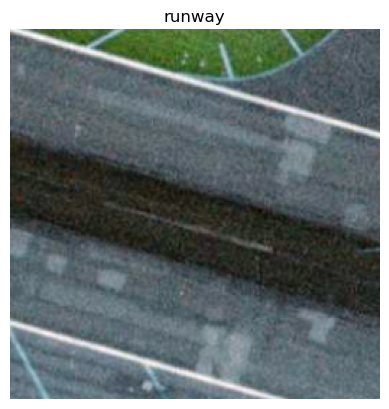

/kaggle/input/landuse-scene-classification/images_train_test_val/train/intersection/intersection_000175.png


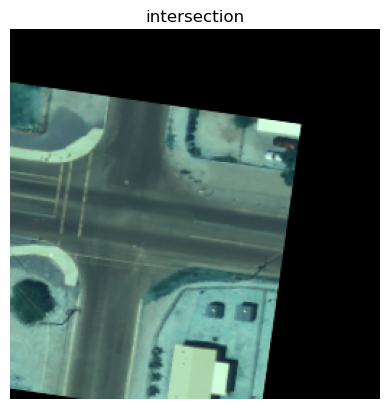

/kaggle/input/landuse-scene-classification/images_train_test_val/train/agricultural/agricultural_000139.png


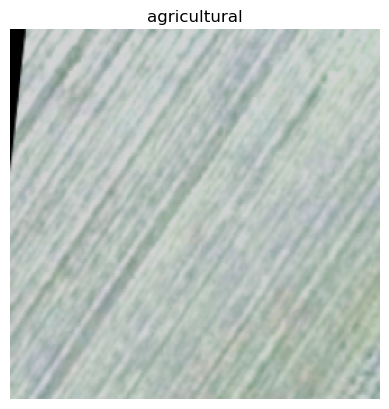

/kaggle/input/landuse-scene-classification/images_train_test_val/train/chaparral/chaparral_000278.png


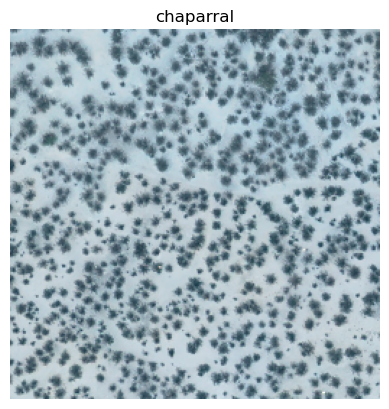

/kaggle/input/landuse-scene-classification/images_train_test_val/train/airplane/airplane_000482.png


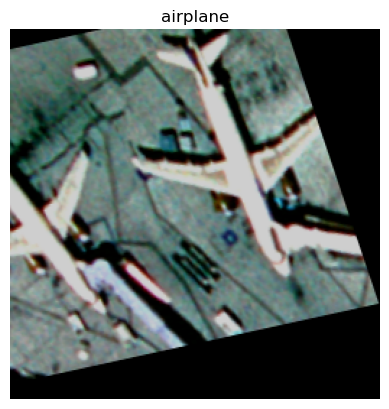

/kaggle/input/landuse-scene-classification/images_train_test_val/train/storagetanks/storagetanks_000207.png


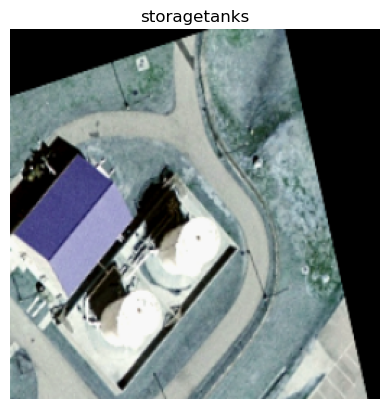

/kaggle/input/landuse-scene-classification/images_train_test_val/train/tenniscourt/tenniscourt_000271.png


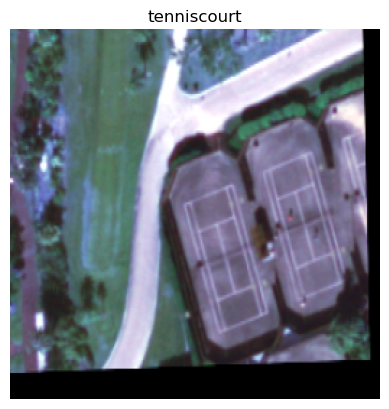

/kaggle/input/landuse-scene-classification/images_train_test_val/train/overpass/overpass_000400.png


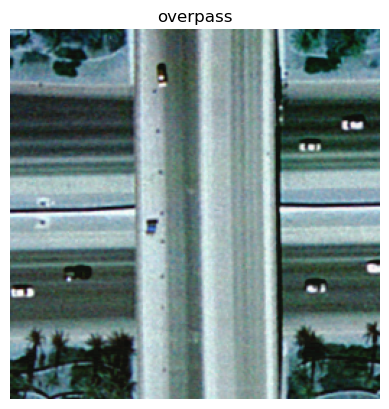

/kaggle/input/landuse-scene-classification/images_train_test_val/train/harbor/harbor_000183.png


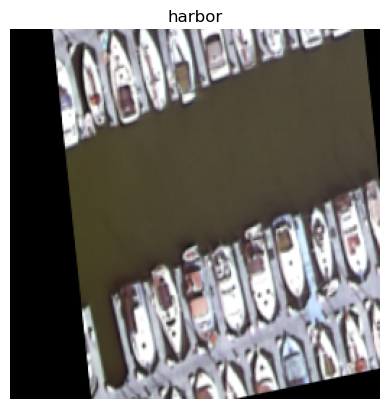

/kaggle/input/landuse-scene-classification/images_train_test_val/train/buildings/buildings_000224.png


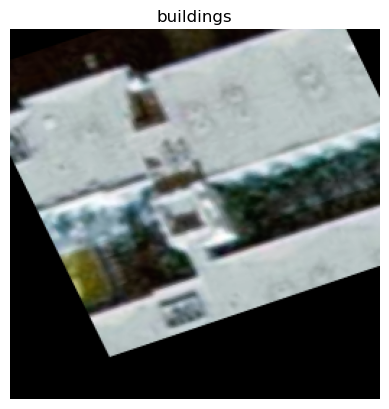

/kaggle/input/landuse-scene-classification/images_train_test_val/train/mediumresidential/mediumresidential_000485.png


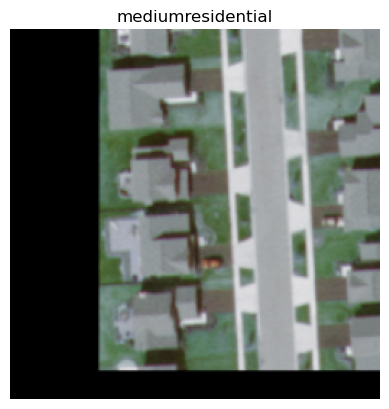

/kaggle/input/landuse-scene-classification/images_train_test_val/train/baseballdiamond/baseballdiamond_000048.png


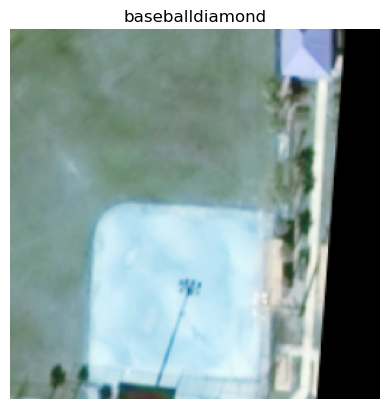

/kaggle/input/landuse-scene-classification/images_train_test_val/train/golfcourse/golfcourse_000289.png


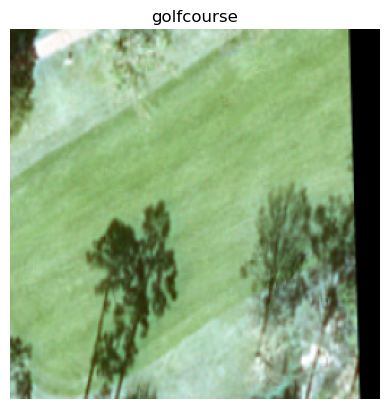

/kaggle/input/landuse-scene-classification/images_train_test_val/train/freeway/freeway_000431.png


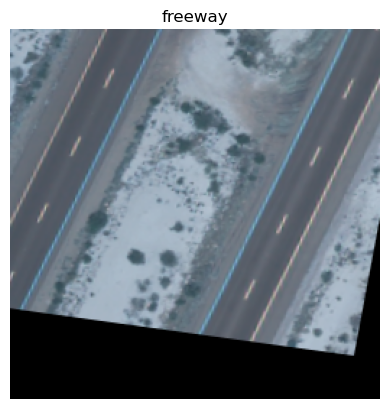

/kaggle/input/landuse-scene-classification/images_train_test_val/train/sparseresidential/sparseresidential_000222.png


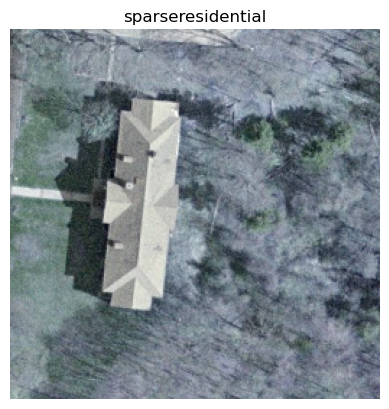

/kaggle/input/landuse-scene-classification/images_train_test_val/train/river/river_000378.png


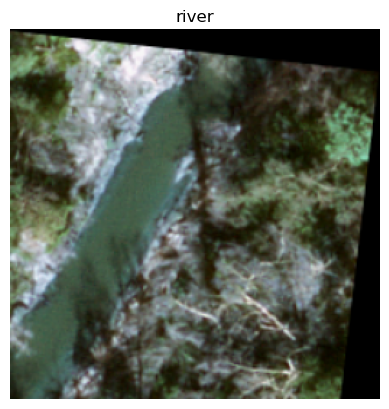

/kaggle/input/landuse-scene-classification/images_train_test_val/train/mobilehomepark/mobilehomepark_000126.png


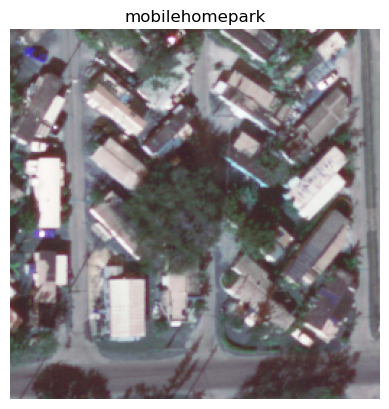

/kaggle/input/landuse-scene-classification/images_train_test_val/train/forest/forest_000055.png


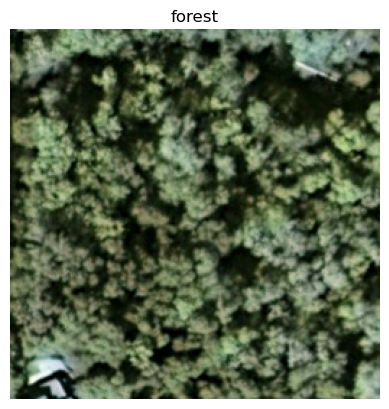

/kaggle/input/landuse-scene-classification/images_train_test_val/train/beach/beach_000368.png


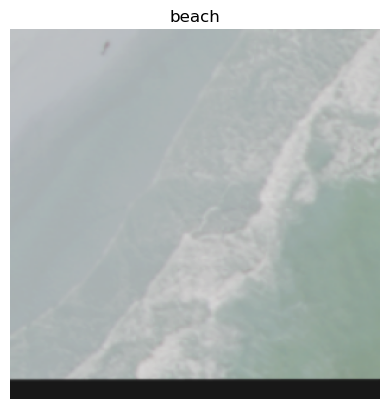

/kaggle/input/landuse-scene-classification/images_train_test_val/train/parkinglot/parkinglot_000156.png


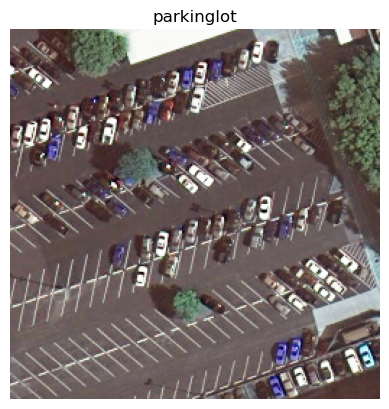

/kaggle/input/landuse-scene-classification/images_train_test_val/train/denseresidential/denseresidential_000001.png


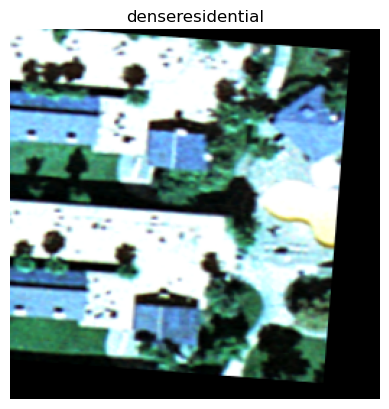

In [36]:
for categoria in train['ClassName'].unique():
    carpeta = os.path.join('/kaggle/input/landuse-scene-classification/images_train_test_val/train/', categoria)
    archivo_imagen = os.listdir(carpeta)[0]
    ruta_imagen = os.path.join(carpeta, archivo_imagen)
    print(ruta_imagen)
    imagen = cv2.imread(ruta_imagen)
    plt.imshow(imagen)
    plt.title(categoria)
    plt.axis('off')
    plt.show()

In [37]:
print("\n\n==========================\nTRAIN\n==========================\n")
for categoria in train['ClassName'].unique():
    carpeta = os.path.join('/kaggle/input/landuse-scene-classification/images_train_test_val/train/', categoria)
    archivo_imagen = os.listdir(carpeta)[0]
    ruta_imagen = os.path.join(carpeta, archivo_imagen)
    imagen = cv2.imread(ruta_imagen)
    rango_min = np.min(imagen)
    rango_max = np.max(imagen)
    print("La Categoría:",categoria, "tiene un rango dinámico de entre:", rango_min, "y" ,rango_max)



TRAIN

La Categoría: runway tiene un rango dinámico de entre: 1 y 255
La Categoría: intersection tiene un rango dinámico de entre: 0 y 255
La Categoría: agricultural tiene un rango dinámico de entre: 0 y 211
La Categoría: chaparral tiene un rango dinámico de entre: 27 y 255
La Categoría: airplane tiene un rango dinámico de entre: 0 y 206
La Categoría: storagetanks tiene un rango dinámico de entre: 0 y 248
La Categoría: tenniscourt tiene un rango dinámico de entre: 0 y 255
La Categoría: overpass tiene un rango dinámico de entre: 12 y 255
La Categoría: harbor tiene un rango dinámico de entre: 0 y 255
La Categoría: buildings tiene un rango dinámico de entre: 0 y 255
La Categoría: mediumresidential tiene un rango dinámico de entre: 0 y 233
La Categoría: baseballdiamond tiene un rango dinámico de entre: 0 y 250
La Categoría: golfcourse tiene un rango dinámico de entre: 0 y 255
La Categoría: freeway tiene un rango dinámico de entre: 0 y 219
La Categoría: sparseresidential tiene un rango di

In [38]:
# Para el conjunto de datos de validación
print("\n\n==========================\nVALIDATION\n==========================\n")
for conjunto in ['/kaggle/input/landuse-scene-classification/images_train_test_val/validation/']:
    for categoria in validation['ClassName'].unique():
        carpeta = os.path.join(conjunto, categoria)
        cantidad_imagenes = len(os.listdir(carpeta))
        print("La Categoría:",categoria, "tiene:", cantidad_imagenes, "imágenes")



VALIDATION

La Categoría: mediumresidential tiene: 100 imágenes
La Categoría: buildings tiene: 100 imágenes
La Categoría: tenniscourt tiene: 100 imágenes
La Categoría: denseresidential tiene: 100 imágenes
La Categoría: baseballdiamond tiene: 100 imágenes
La Categoría: intersection tiene: 100 imágenes
La Categoría: harbor tiene: 100 imágenes
La Categoría: parkinglot tiene: 100 imágenes
La Categoría: river tiene: 100 imágenes
La Categoría: overpass tiene: 100 imágenes
La Categoría: mobilehomepark tiene: 100 imágenes
La Categoría: runway tiene: 100 imágenes
La Categoría: forest tiene: 100 imágenes
La Categoría: beach tiene: 100 imágenes
La Categoría: freeway tiene: 100 imágenes
La Categoría: airplane tiene: 100 imágenes
La Categoría: storagetanks tiene: 100 imágenes
La Categoría: chaparral tiene: 100 imágenes
La Categoría: golfcourse tiene: 100 imágenes
La Categoría: sparseresidential tiene: 100 imágenes
La Categoría: agricultural tiene: 100 imágenes


/kaggle/input/landuse-scene-classification/images_train_test_val/validation/mediumresidential/mediumresidential_000148.png


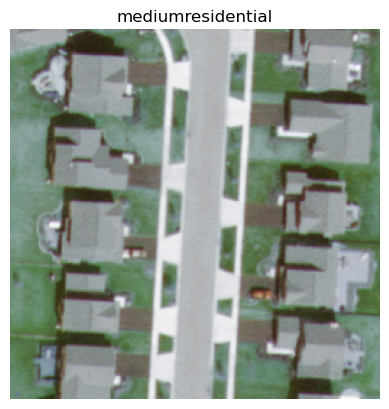

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/buildings/buildings_000445.png


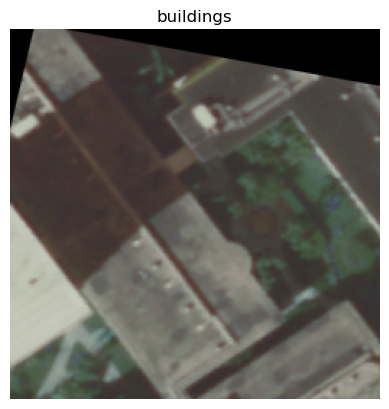

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/tenniscourt/tenniscourt_000136.png


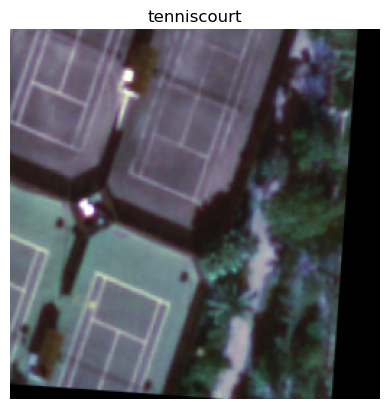

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/denseresidential/denseresidential_000424.png


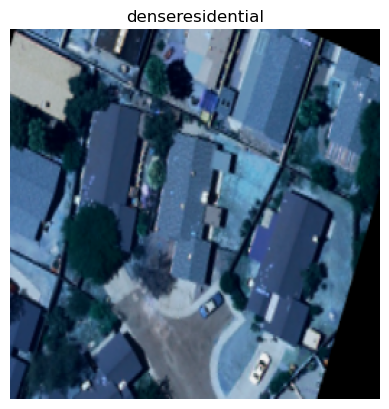

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/baseballdiamond/baseballdiamond_000367.png


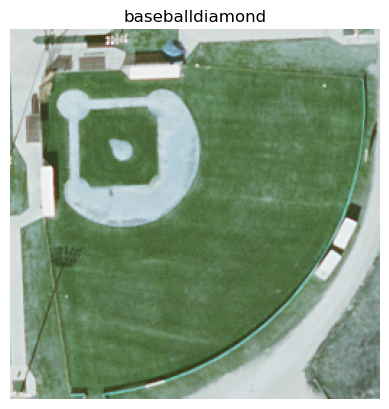

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/intersection/intersection_000072.png


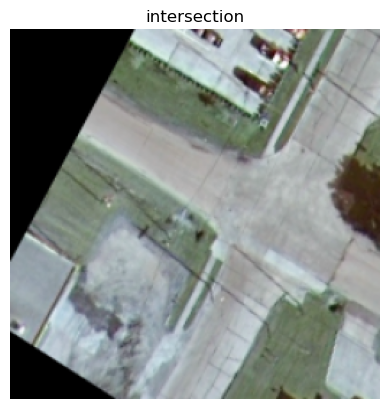

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/harbor/harbor_000187.png


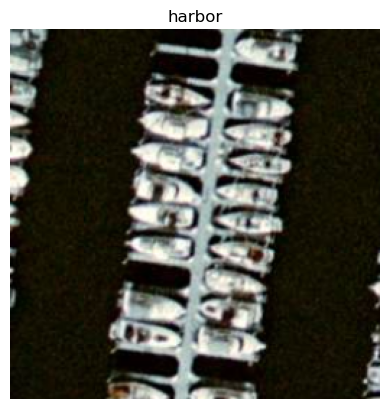

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/parkinglot/parkinglot_000140.png


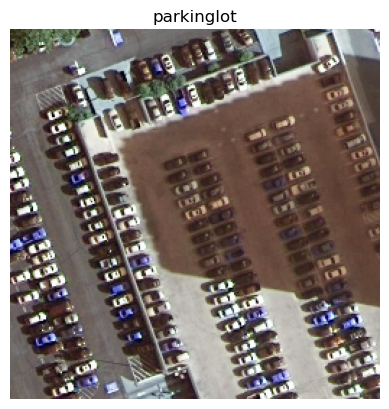

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/river/river_000489.png


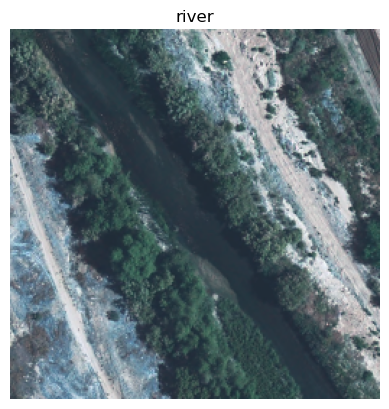

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/overpass/overpass_000150.png


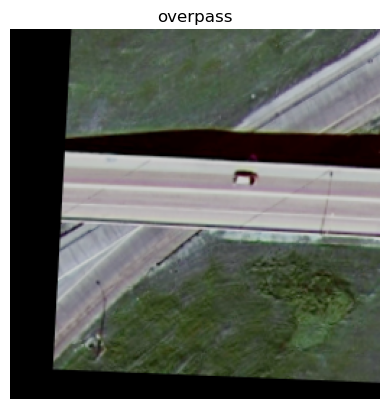

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/mobilehomepark/mobilehomepark_000066.png


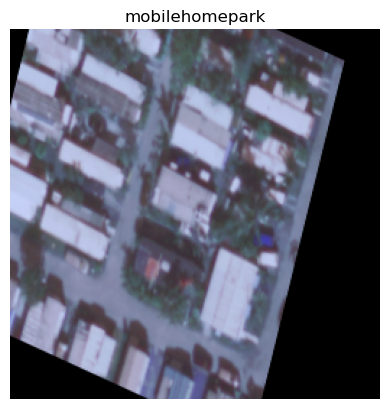

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/runway/runway_000479.png


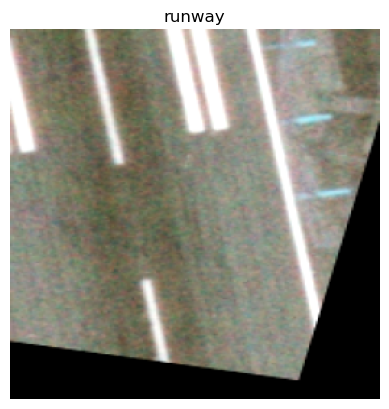

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/forest/forest_000255.png


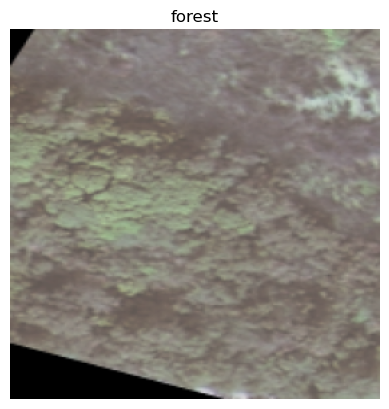

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/beach/beach_000362.png


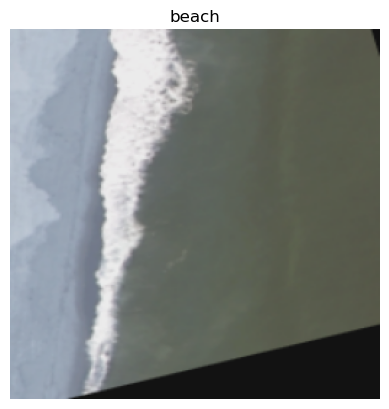

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/freeway/freeway_000185.png


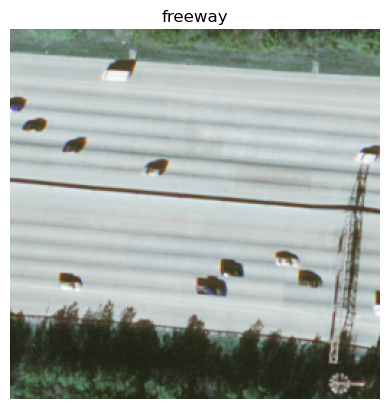

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/airplane/airplane_000293.png


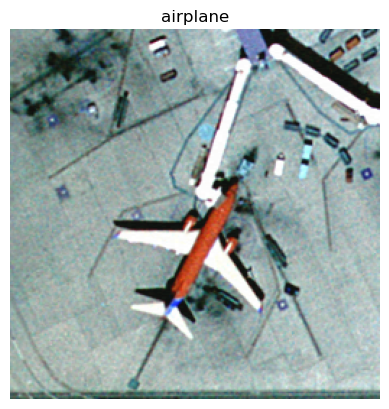

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/storagetanks/storagetanks_000235.png


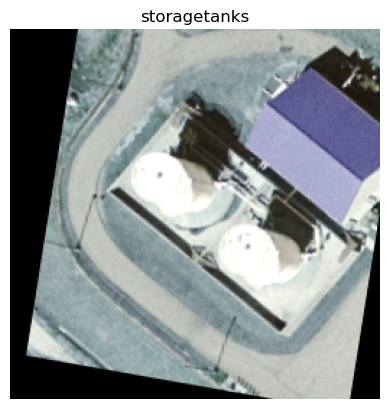

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/chaparral/chaparral_000441.png


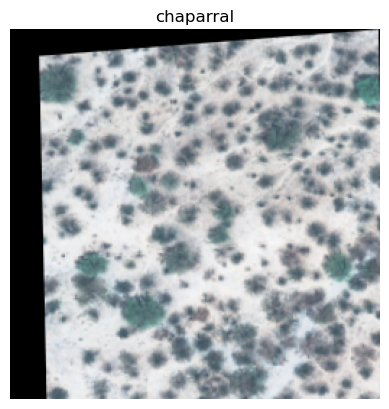

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/golfcourse/golfcourse_000300.png


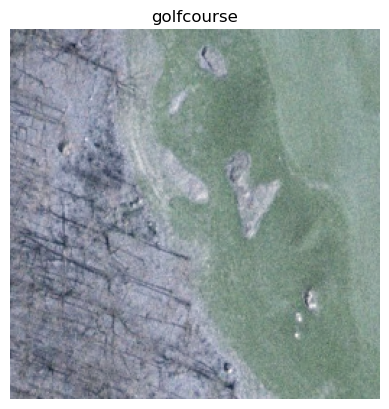

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/sparseresidential/sparseresidential_000182.png


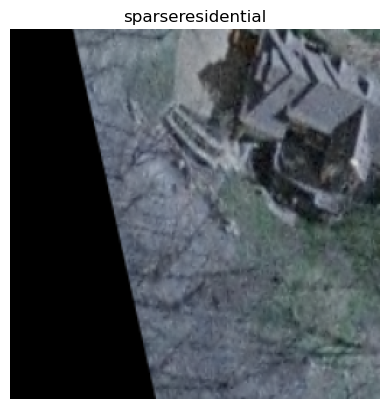

/kaggle/input/landuse-scene-classification/images_train_test_val/validation/agricultural/agricultural_000037.png


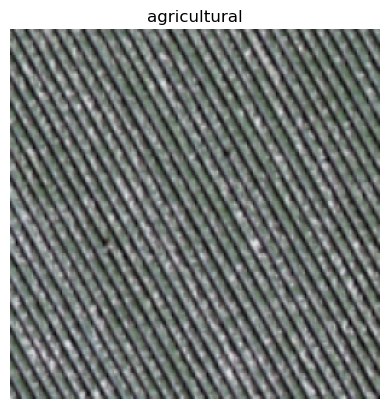

In [39]:
for categoria in validation['ClassName'].unique():
    carpeta = os.path.join('/kaggle/input/landuse-scene-classification/images_train_test_val/validation/', categoria)
    archivo_imagen = os.listdir(carpeta)[0]
    ruta_imagen = os.path.join(carpeta, archivo_imagen)
    print(ruta_imagen)
    imagen = cv2.imread(ruta_imagen)
    plt.imshow(imagen)
    plt.title(categoria)
    plt.axis('off')
    plt.show()

In [40]:
print("\n\n==========================\nVALIDATION\n==========================\n")
for categoria in validation['ClassName'].unique():
    carpeta = os.path.join('/kaggle/input/landuse-scene-classification/images_train_test_val/validation/', categoria)
    archivo_imagen = os.listdir(carpeta)[0]
    ruta_imagen = os.path.join(carpeta, archivo_imagen)
    imagen = cv2.imread(ruta_imagen)
    rango_min = np.min(imagen)
    rango_max = np.max(imagen)
    print("La Categoría:",categoria, "tiene un rango dinámico de entre:", rango_min, "y" ,rango_max)



VALIDATION

La Categoría: mediumresidential tiene un rango dinámico de entre: 12 y 255
La Categoría: buildings tiene un rango dinámico de entre: 0 y 203
La Categoría: tenniscourt tiene un rango dinámico de entre: 0 y 255
La Categoría: denseresidential tiene un rango dinámico de entre: 0 y 240
La Categoría: baseballdiamond tiene un rango dinámico de entre: 15 y 255
La Categoría: intersection tiene un rango dinámico de entre: 0 y 255
La Categoría: harbor tiene un rango dinámico de entre: 0 y 255
La Categoría: parkinglot tiene un rango dinámico de entre: 0 y 255
La Categoría: river tiene un rango dinámico de entre: 23 y 255
La Categoría: overpass tiene un rango dinámico de entre: 0 y 206
La Categoría: mobilehomepark tiene un rango dinámico de entre: 0 y 247
La Categoría: runway tiene un rango dinámico de entre: 0 y 255
La Categoría: forest tiene un rango dinámico de entre: 0 y 213
La Categoría: beach tiene un rango dinámico de entre: 18 y 235
La Categoría: freeway tiene un rango dinámic

In [41]:
# Para el conjunto de datos de test
print("\n\n==========================\nTEST\n==========================\n")
for conjunto in ['/kaggle/input/landuse-scene-classification/images_train_test_val/test/']:
    for categoria in test['ClassName'].unique():
        carpeta = os.path.join(conjunto, categoria)
        cantidad_imagenes = len(os.listdir(carpeta))
        print("La Categoría:",categoria, "tiene:", cantidad_imagenes, "imágenes")



TEST

La Categoría: river tiene: 50 imágenes
La Categoría: mediumresidential tiene: 50 imágenes
La Categoría: overpass tiene: 50 imágenes
La Categoría: storagetanks tiene: 50 imágenes
La Categoría: golfcourse tiene: 50 imágenes
La Categoría: chaparral tiene: 50 imágenes
La Categoría: tenniscourt tiene: 50 imágenes
La Categoría: buildings tiene: 50 imágenes
La Categoría: denseresidential tiene: 50 imágenes
La Categoría: beach tiene: 50 imágenes
La Categoría: runway tiene: 50 imágenes
La Categoría: airplane tiene: 50 imágenes
La Categoría: intersection tiene: 50 imágenes
La Categoría: forest tiene: 50 imágenes
La Categoría: mobilehomepark tiene: 50 imágenes
La Categoría: sparseresidential tiene: 50 imágenes
La Categoría: freeway tiene: 50 imágenes
La Categoría: parkinglot tiene: 50 imágenes
La Categoría: agricultural tiene: 50 imágenes
La Categoría: baseballdiamond tiene: 50 imágenes
La Categoría: harbor tiene: 50 imágenes


/kaggle/input/landuse-scene-classification/images_train_test_val/test/river/river_000133.png


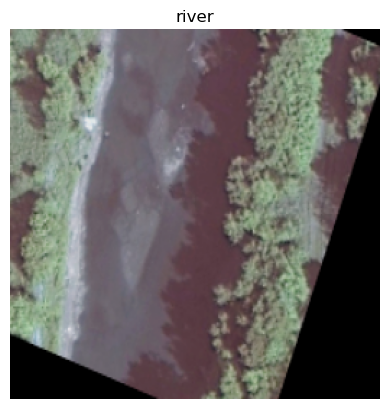

/kaggle/input/landuse-scene-classification/images_train_test_val/test/mediumresidential/mediumresidential_000070.png


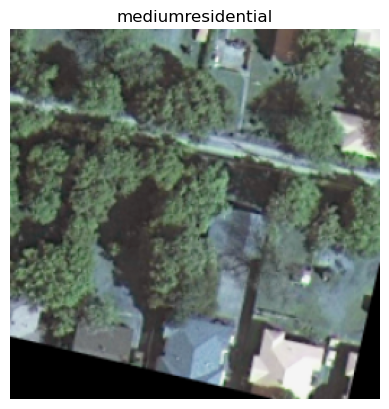

/kaggle/input/landuse-scene-classification/images_train_test_val/test/overpass/overpass_000444.png


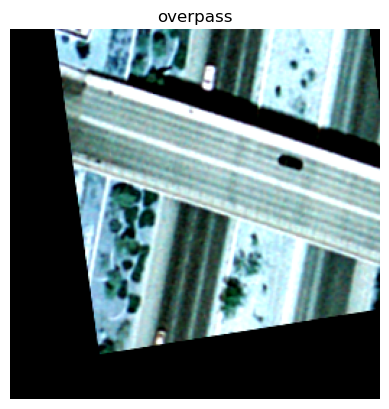

/kaggle/input/landuse-scene-classification/images_train_test_val/test/storagetanks/storagetanks_000409.png


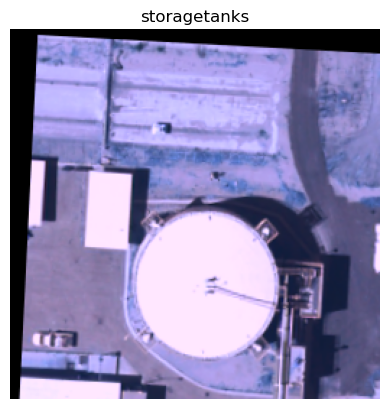

/kaggle/input/landuse-scene-classification/images_train_test_val/test/golfcourse/golfcourse_000120.png


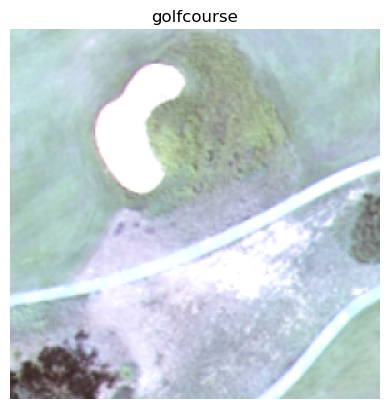

/kaggle/input/landuse-scene-classification/images_train_test_val/test/chaparral/chaparral_000280.png


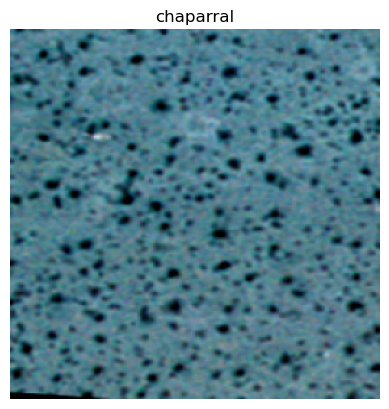

/kaggle/input/landuse-scene-classification/images_train_test_val/test/tenniscourt/tenniscourt_000356.png


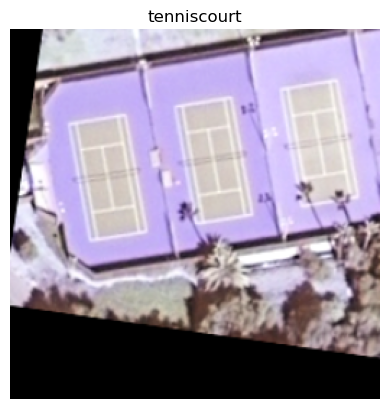

/kaggle/input/landuse-scene-classification/images_train_test_val/test/buildings/buildings_000338.png


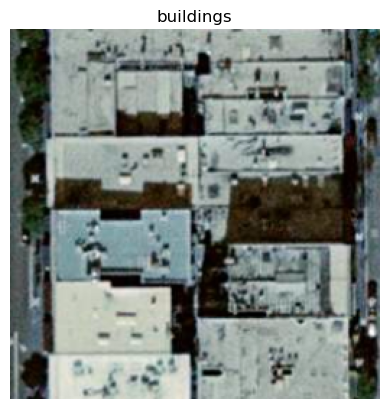

/kaggle/input/landuse-scene-classification/images_train_test_val/test/denseresidential/denseresidential_000254.png


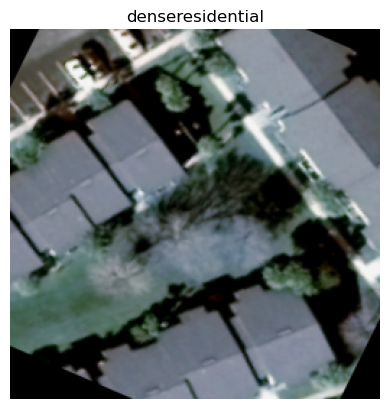

/kaggle/input/landuse-scene-classification/images_train_test_val/test/beach/beach_000357.png


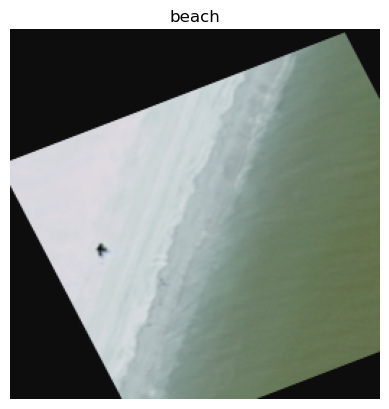

/kaggle/input/landuse-scene-classification/images_train_test_val/test/runway/runway_000105.png


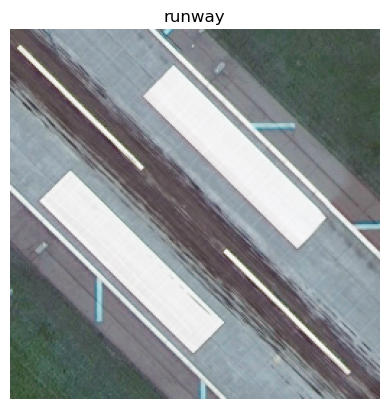

/kaggle/input/landuse-scene-classification/images_train_test_val/test/airplane/airplane_000058.png


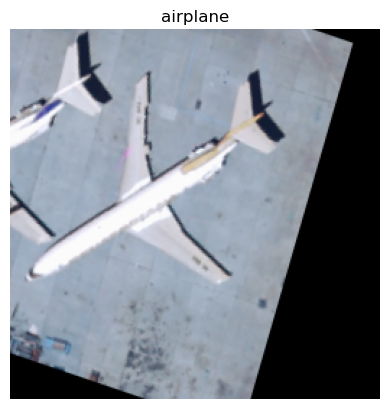

/kaggle/input/landuse-scene-classification/images_train_test_val/test/intersection/intersection_000371.png


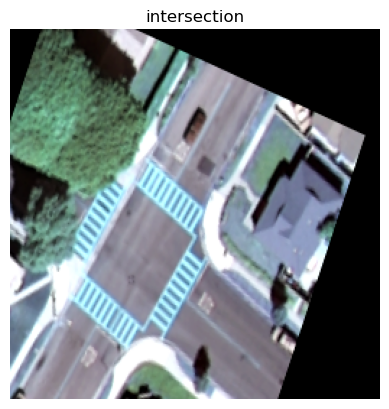

/kaggle/input/landuse-scene-classification/images_train_test_val/test/forest/forest_000247.png


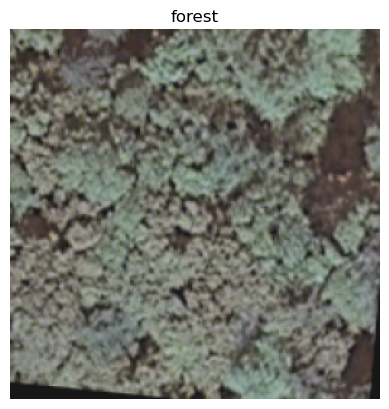

/kaggle/input/landuse-scene-classification/images_train_test_val/test/mobilehomepark/mobilehomepark_000317.png


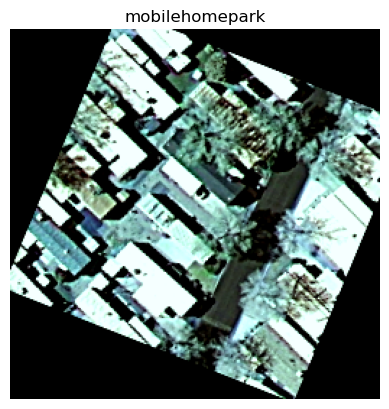

/kaggle/input/landuse-scene-classification/images_train_test_val/test/sparseresidential/sparseresidential_000412.png


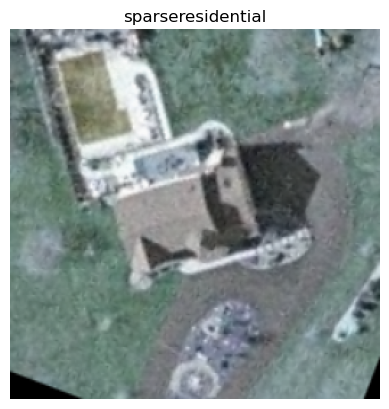

/kaggle/input/landuse-scene-classification/images_train_test_val/test/freeway/freeway_000434.png


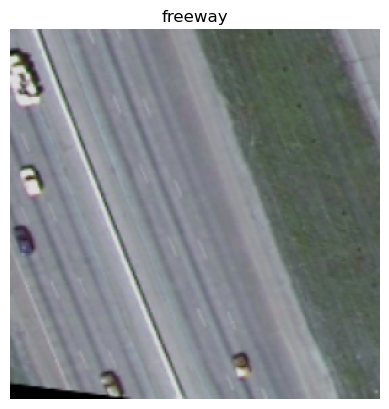

/kaggle/input/landuse-scene-classification/images_train_test_val/test/parkinglot/parkinglot_000042.png


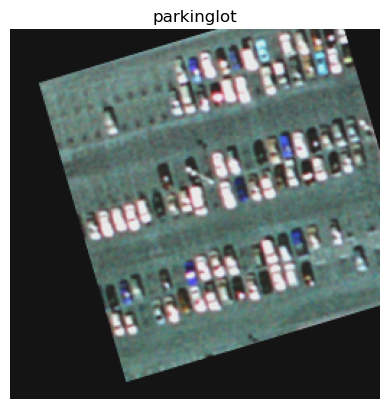

/kaggle/input/landuse-scene-classification/images_train_test_val/test/agricultural/agricultural_000033.png


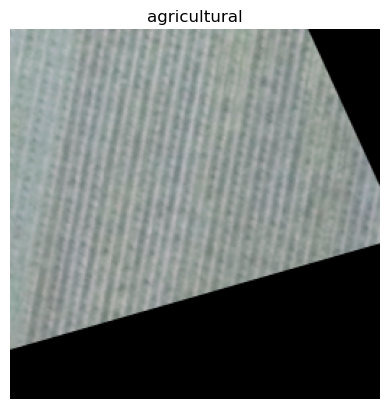

/kaggle/input/landuse-scene-classification/images_train_test_val/test/baseballdiamond/baseballdiamond_000033.png


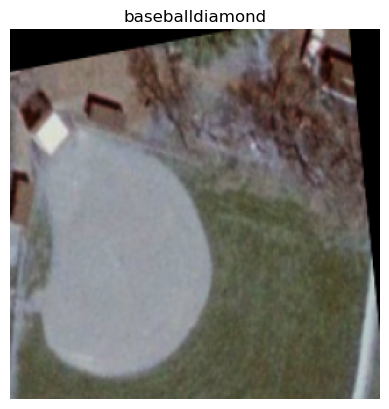

/kaggle/input/landuse-scene-classification/images_train_test_val/test/harbor/harbor_000418.png


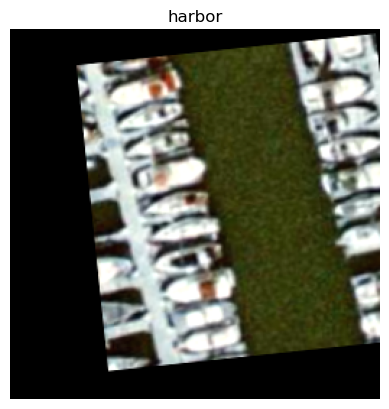

In [42]:
for categoria in test['ClassName'].unique():
    carpeta = os.path.join('/kaggle/input/landuse-scene-classification/images_train_test_val/test/', categoria)
    archivo_imagen = os.listdir(carpeta)[0]
    ruta_imagen = os.path.join(carpeta, archivo_imagen)
    print(ruta_imagen)
    imagen = cv2.imread(ruta_imagen)
    plt.imshow(imagen)
    plt.title(categoria)
    plt.axis('off')
    plt.show()

In [43]:
print("\n\n==========================\nTEST\n==========================\n")
for categoria in test['ClassName'].unique():
    carpeta = os.path.join('/kaggle/input/landuse-scene-classification/images_train_test_val/test/', categoria)
    archivo_imagen = os.listdir(carpeta)[0]
    ruta_imagen = os.path.join(carpeta, archivo_imagen)
    imagen = cv2.imread(ruta_imagen)
    rango_min = np.min(imagen)
    rango_max = np.max(imagen)
    print("La Categoría:",categoria, "tiene un rango dinámico de entre:", rango_min, "y" ,rango_max)



TEST

La Categoría: river tiene un rango dinámico de entre: 0 y 232
La Categoría: mediumresidential tiene un rango dinámico de entre: 0 y 245
La Categoría: overpass tiene un rango dinámico de entre: 0 y 255
La Categoría: storagetanks tiene un rango dinámico de entre: 0 y 255
La Categoría: golfcourse tiene un rango dinámico de entre: 36 y 255
La Categoría: chaparral tiene un rango dinámico de entre: 0 y 221
La Categoría: tenniscourt tiene un rango dinámico de entre: 0 y 255
La Categoría: buildings tiene un rango dinámico de entre: 0 y 255
La Categoría: denseresidential tiene un rango dinámico de entre: 0 y 244
La Categoría: beach tiene un rango dinámico de entre: 13 y 224
La Categoría: runway tiene un rango dinámico de entre: 24 y 255
La Categoría: airplane tiene un rango dinámico de entre: 0 y 251
La Categoría: intersection tiene un rango dinámico de entre: 0 y 255
La Categoría: forest tiene un rango dinámico de entre: 23 y 188
La Categoría: mobilehomepark tiene un rango dinámico de 

### 1.3. Creación de los conjuntos de datos en formato Keras/Tensorflow
​
Con el objetivo de crear una base de datos en el formato Keras/Tensorflow a partir de las imágenes proporcionadas utilizaremos la función <code>**tf.keras.utils.image_dataset_from_directory()**</code> ya que nos permite crear bases de datos a partir de imágenes guardadas en carpetas.

La documentación de esta función se encuentra tanto en la web de [Keras](https://keras.io/api/data_loading/image/) como en la de [Tensorflow](https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory) .

Además, aprovecharemos para redimensionar las imágenes y pasarlas a tamaño 224x224, que es el tamaño con el que se ha entrenado la red VGG16 que utilizaremos en un apartado posterior.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
<strong>Ejercicio[0,5 pts]:</strong> Utiliza la función  <code>image_dataset_from_directory()</code> para generar 3 conjuntos de datos (<code>train_data</code>, <code>val_data</code> y <code>test_data</code>) a partir de las carpetas analizadas. Las imágenes deben ser redimensionadas a tamaño 224x224 píxels RGB (224,224,3) y agrupadas en lotes de tamaño 32 (batch=32) manteniendo su rango dinámico.
</div>

In [5]:
directorio_entrenamiento = '/kaggle/input/landuse-scene-classification/images_train_test_val/train/'
directorio_validacion = '/kaggle/input/landuse-scene-classification/images_train_test_val/validation/'
directorio_prueba = '/kaggle/input/landuse-scene-classification/images_train_test_val/test/'

train_data = image_dataset_from_directory(
    directorio_entrenamiento,
    image_size=(224, 224),
    batch_size=32,
    shuffle=True,
    seed=42,
    interpolation='bilinear'
)

val_data = image_dataset_from_directory(
    directorio_validacion,
    image_size=(224, 224),
    batch_size=32,
    shuffle=True,
    seed=42,
    interpolation='bilinear'
)

test_data = image_dataset_from_directory(
    directorio_prueba,
    image_size=(224, 224),
    batch_size=32,
    shuffle=True,
    seed=42,
    interpolation='bilinear'
)

Found 7350 files belonging to 21 classes.
Found 2100 files belonging to 21 classes.
Found 1050 files belonging to 21 classes.


## 2. Modelo ANN (1,5 puntos)

En este apartado, vamos a entrenar y evaluar un modelo muy sencillo completamente conectado para establecer un resultado de referencia.

Dado que en una red neuronal artificial las entradas son unidimensionales, lo primero que tenemos que hacer es redimensionar los datos de entrada (las imágenes) para convertirlos en arrays de una dimensión.

Como trabajar con imágenes de tamaño 224x224 en una red completamente conectada implicaría entrenar un número de parámetros excesivamente elevado definiremos un modelo en el que se realizará previamente un redimensionado de las imágenes de entrada a un tamaño de 32x32 y un achatamiento (*flattening*) de los píxeles para así generar un vector unidimensional de tamaño 3072 (32x32x3). 

Posteriormente entrenaremos un clasificador (una red completamente conectada) para llevar a cabo la clasificación de nuestros datos.

En este apartado utilizaremos las capas [Resizing](https://keras.io/api/layers/preprocessing_layers/image_preprocessing/resizing/), [Rescaling](https://keras.io/api/layers/preprocessing_layers/image_preprocessing/rescaling/), [Flatten](https://keras.io/api/layers/reshaping_layers/flatten/), [Dense](https://keras.io/api/layers/core_layers/dense/) y [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) de keras.


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
    <strong>Ejercicio:</strong> Implementa un modelo <strong>secuencial</strong> de Keras (a partir de la clase <code>Sequential()</code>) con las siguientes especificaciones:
    <ul>
        <li>Una capa que reduzca las dimensiones de entrada de (224,224) a (32,32)</li>
        <li>Una capa de reescalado para conseguir que los valores de la imagen estén entre 0 y 1</li>
        <li>Una capa Flatten para convertir la imagen en un vector de 3072 posiciones</li>
        <li>Una capa completamente conectada de 1024 neuronas y activación ReLU</li>
        <li>Una capa de Dropout (con probabilidad 0.5)</li>
        <li>Una capa de salida completamente conectada correspondiente a la clasificación final cuyo número de neuronas debe ser igual al múmero de clases de la base de datos y con la función de activación adecuada para llevar a cabo esta tarea de clasificación.</li>
    </ul>
        
Compilar y entrenar el modelo siguiendo las siguientes indicaciones:
     <ul>
         <li>Utilizar el optimizador Adam con  <i>learning rate</i> de 0.0001.</li>
         <li>Entrenar durante 100 épocas utilizando  <i>EarlyStopping</i> con una persistencia de 10 épocas, monitorizando la función de pérdida en el conjunto de validación, y guardando los pesos que mejor resultado hayan obtenido.</li>
         <li>Monitorizar la métrica  <i>accuracy</i> durante entrenamiento y validación.</li>
         <li>Mostrar las gráficas de accuracy y loss. En cada gráfica debe visualizarse la curva de entrenamiento y la de validación. NOTA: Se recomienda hacer una función que imprima ambas gráficas para poder reutilizarla en próximos apartados.</li>
         <li>Realizar la evaluación del modelo una vez ha finalizado el entrenamiento para mostrar la pérdida y la precisión final sobre los datos de test.</li>
    </ul>
    Preguntas a responder: ¿Cúal es el número de parámetros a entrenar? ¿y el tiempo de entrenamiento? ¿Qué precisión se obtiene con este modelo? Comenta los resultados.<br/>    
    <strong> NOTA: se recomienda, al final de la creación de cada modelo, utilizar la función <code>summary()</code> para comprobar la estructura de la red creada, así como el numero de parámetros que se deben entrenar. Se recomienda hacerlo en todos los ejercicios.</strong>
</div>

In [33]:
# Definición de la red
modelo_ANN = Sequential()

# Capa para reducir dimensiones
modelo_ANN.add(Resizing(32, 32, interpolation='bilinear', input_shape=(224, 224, 3)))

# Capa de reescalado
modelo_ANN.add(Rescaling(1./255, offset=0.0))

# Capa de flatten
modelo_ANN.add(Flatten())

# Capa de activacion
modelo_ANN.add(Dense(1024, activation='relu'))

# Capa de dropout
modelo_ANN.add(Dropout(0.5))

# Capa de salida 
modelo_ANN.add(Dense(21, activation='softmax'))

In [34]:
# Compilación de la red
modelo_ANN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [35]:
# Definir callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(patience=10, monitor='val_loss', restore_best_weights=True)
checkpoint = tf.keras.callbacks.ModelCheckpoint('mejor_modelo.h5', monitor='val_loss', save_best_only=True)

In [48]:
# Entrenamiento de la red
start_time = time.time()
entrenamiento_ANN = modelo_ANN.fit(train_data, 
                                   epochs=100, 
                                   validation_data=val_data, 
                                   callbacks=[early_stopping, checkpoint])
end_time = time.time()

Epoch 1/100
230/230 [==============================] - 25s 101ms/step - loss: 3.1202 - accuracy: 0.0624 - val_loss: 2.9953 - val_accuracy: 0.1057
Epoch 2/100
230/230 [==============================] - 24s 100ms/step - loss: 3.0013 - accuracy: 0.0898 - val_loss: 2.9710 - val_accuracy: 0.1119
Epoch 3/100
230/230 [==============================] - 23s 99ms/step - loss: 2.9561 - accuracy: 0.1022 - val_loss: 2.9374 - val_accuracy: 0.1171
Epoch 4/100
230/230 [==============================] - 24s 101ms/step - loss: 2.9110 - accuracy: 0.1192 - val_loss: 2.9000 - val_accuracy: 0.1386
Epoch 5/100
230/230 [==============================] - 23s 99ms/step - loss: 2.8658 - accuracy: 0.1377 - val_loss: 2.8695 - val_accuracy: 0.1510
Epoch 6/100
230/230 [==============================] - 24s 101ms/step - loss: 2.8237 - accuracy: 0.1502 - val_loss: 2.8430 - val_accuracy: 0.1567
Epoch 7/100
230/230 [==============================] - 25s 105ms/step - loss: 2.7829 - accuracy: 0.1645 - val_loss: 2.8130 - v

In [11]:
#Función para mostrar las gráficas de Accuracy y Perdida
def mostrar_graficas(modelo):
    acc = modelo.history['accuracy']
    val_acc = modelo.history['val_accuracy']
    loss = modelo.history['loss']
    val_loss = modelo.history['val_loss']
    epochs_range = range(len(acc))

    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Accuracy entrenamiento')
    plt.plot(epochs_range, val_acc, label='Accuracy validación')
    plt.legend(loc='lower right')
    plt.title('Accuracy durante entrenamiento y validación')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Pérdida entrenamiento')
    plt.plot(epochs_range, val_loss, label='Pérdida validación')
    plt.legend(loc='upper right')
    plt.title('Pérdida durante entrenamiento y validación')
    plt.show()

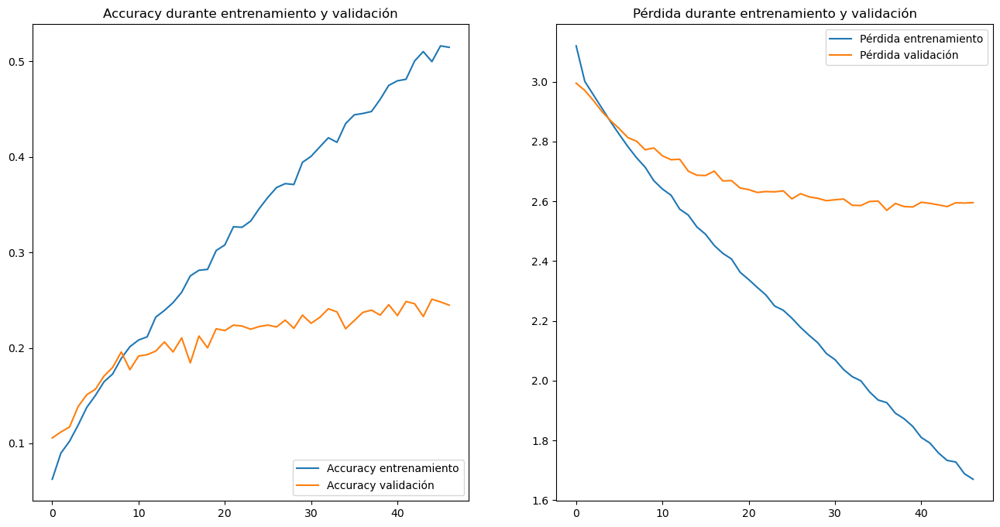

In [50]:
# Plot del training loss i l'accuracy
mostrar_graficas(entrenamiento_ANN)

In [36]:
#Información del modelo
modelo_ANN.summary() 

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_1 (Resizing)       (None, 32, 32, 3)         0         
                                                                 
 rescaling_2 (Rescaling)     (None, 32, 32, 3)         0         
                                                                 
 flatten_4 (Flatten)         (None, 3072)              0         
                                                                 
 dense_13 (Dense)            (None, 1024)              3146752   
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_14 (Dense)            (None, 21)                21525     
                                                                 
Total params: 3,168,277
Trainable params: 3,168,277
No

In [52]:
# Estadísticas y resultados del modelo 
test_loss, test_acc = modelo_ANN.evaluate(test_data)

print("\nTiempo de entrenamiento:", end_time - start_time)
print('Pérdida en el conjunto de test:', test_loss)
print('Precisión en el conjunto de test:', test_acc)

33/33 [==============================] - 5s 113ms/step - loss: 2.5913 - accuracy: 0.2429

Tiempo de entrenamiento: 1311.375783920288
Pérdida en el conjunto de test: 2.5913305282592773
Precisión en el conjunto de test: 0.24285714328289032


<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
    
Las respuestas a las preguntas planteadas son:

* ¿Cúal es el número de parámetros a entrenar?  3,168,277   
* ¿Y el tiempo de entrenamiento? El tiempo total de entrenamiento ha sido de aproximadamente de 21 minutos
* ¿Qué precisión se obtiene con este modelo? 24,28%
    
Como se puede comprobar la precisión del modelo es bajo teniendo un alto numero de perdidas en el conjunto de test. En las graficas anteriores se puede comprobar de una manera visual lo que los datos numéricos nos dicen.Por lo que podemos concluir que no es un buen modelo.
<br><br>
</div>

## 3. Red convolucional pequeña (2 puntos)

Dadas las bajas prestaciones del modelo anterior vamos a probar otro tipo de redes con el objetivo de obtener unos mejores resultados en la tarea de clasificación que debemos llevar a cabo.

Las redes convolucionales (CNN) son especialmente adecuadas para modelar datos donde hay patrones en 2 dimensiones, como es el caso de las imágenes.

En la tarea de clasificación, la estructura de una CNN se divide en dos grandes bloques:

* **Bloque extractor de características**: En este bloque se generan diferentes niveles de abstracción de la imagen de entrada mediante capas convolucionales. Cuanto más profundas son estas capas, más preparadas están para la tarea de clasificación.
* **Clasificador**: Este bloque está formado por capas totalmente conectadas, la salida de deste bloque será la probabilidad asociada a cada clase.

En el apartado anterior, el bloque "extractor de características" era extremadamente simple, por no decir inexistente. En este apartado, vamos a hacer uso de capas convolucionales para poder aprender mejores abstracciones de las imágenes de entrada con el fin de mejorar su clasificación.

En este apartado utilizaremos las capas [Conv2D](https://keras.io/api/layers/convolution_layers/convolution2d/),  [MaxPooling2D](https://keras.io/api/layers/pooling_layers/max_pooling2d/), [GlobalAveragePooling2D](https://keras.io/api/layers/pooling_layers/global_average_pooling2d/), [Dense](https://keras.io/api/layers/core_layers/dense/) y [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) de keras.

**Nota: Se recomienda, a partir de este punto realizar el entrenamiento en una máquina con GPU (puede activarse en plataformas como Google Colab o Kaggle) con el fin de reducir los tiempos de entrenamiento.**

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
    <strong>Ejercicio [2 puntos]:</strong> A partir del modelo <strong>funcional</strong> de keras (y la clase <code>Model()</code>), implementa una red con las siguientes características:
    <ul>
        <li>Un bloque extractor de características que conste de:
            <ul>
                <li>Una capa de entrada de dimensiones adecuadas a los datos.</li>
                <li>Una capa de rescalado para conseguir que los valores de la imagen estén entre 0 y 1.</li>
                <li>3 capas convolucionales con tamaño de kernel (5x5) para la primera y (3x3) para las 2 siguientes. Se utilizará padding '<i>same</i>' y activación ReLU. El número de filtros para cada capa convolucional será 16, 32 y 64 respectivamente.</li>
                <li>A cada capa convolucional le sigue una capa de <i>Max Pooling</i></li>
                <li>Una capa de <i>average pooling</i> (GlobalAveragePooling2D) para reducir las dimensiones a un vector de 1024 dimensiones.</li>
            </ul></li>
        <li>El clasificador final sigue la estructura del modelo del apartado anterior:
            <ul>
                <li>Una capa completamente conectada de 1024 neuronas y activación ReLU</li>
                <li>Una capa de Dropout (con probabilidad 0.5)</li>
                <li>Una capa de salida completamente conectada correspondiente a la clasificación final cuyo número de neuronas debe ser igual al múmero de clases de la base de datos y con la función de activación adecuada para llevar a cabo esta tarea de clasificación.</li>
            </ul></li>
    </ul>
    
Compilar y entrenar el modelo siguiendo las siguientes indicaciones:
     <ul>
         <li>Utilizar el optimizador Adam con  <i>learning rate</i> de 0.001.</li>
          <li>Entrenar durante 100 épocas utilizando  <i>EarlyStopping</i> con una persistencia de 10 épocas, monitorizando la función de pérdida en el conjunto de validación, y guardando los pesos que mejor resultado hayan obtenido.</li>
         <li>Monitorizar la métrica  <i>accuracy</i> durante entrenamiento y validación.</li>
         <li>Mostrar las gráficas de <i>accuracy</i> y <i>loss</i>. En cada gráfica debe visualizarse la curva de entrenamiento y la de validación.</li>
         <li>Realizar la evaluación del modelo una vez ha finalizado el entrenamiento para mostrar la pérdida y la precisión final sobre los datos de test.</li>
    </ul>
    Preguntas a responder: ¿Cúal es el número de parámetros a entrenar? ¿y el tiempo de entrenamiento? ¿Qué precisión se obtiene con este modelo? Comenta los resultados.
</div>

In [37]:
# Definición de la red

# Dimensiones de entrada de los datos
input_shape = (224, 224, 3)

# Capa de entrada
input_layer = Input(shape=input_shape)

# Capa de rescalado
rescale_layer = Rescaling(scale=1./255)(input_layer)

# Bloque extractor de características

## Capa 1
conv1_layer = Conv2D(filters=16, kernel_size=(5, 5), padding='same', activation='relu')(rescale_layer)
pool1_layer = MaxPooling2D(pool_size=(2, 2))(conv1_layer)

## Capa 2
conv2_layer = Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu')(pool1_layer)
pool2_layer = MaxPooling2D(pool_size=(2, 2))(conv2_layer)

## Capa 3
conv3_layer = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu')(pool2_layer)
pool3_layer = MaxPooling2D(pool_size=(2, 2))(conv3_layer)

## Capa Global
global_pool_layer = GlobalAveragePooling2D()(pool3_layer)

# Clasificador final
dense1_layer = Dense(units=64, activation='relu')(global_pool_layer)
dropout_layer = Dropout(rate=0.5)(dense1_layer)

# Capa Salida
output_layer = Dense(units=21, activation='softmax')(dropout_layer)

# Crear modelo
modelo_CNN = Model(inputs=input_layer, outputs=output_layer)

In [38]:
# Compilación de la red
optimizer = Adam(learning_rate=0.001)
modelo_CNN.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [39]:
# EarlyStopping y ModelCheckpoint
earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath='best_weights.h5', monitor='val_loss', save_best_only=True)

In [56]:
# Entrenamiento
start_time = time.time()
entrenamiento_CNN = modelo_CNN.fit(train_data,
                                   epochs=100,
                                   validation_data=val_data,
                                   callbacks=[earlystop_callback, checkpoint_callback])
end_time = time.time()

Epoch 1/100
230/230 [==============================] - 30s 115ms/step - loss: 2.9846 - accuracy: 0.0718 - val_loss: 2.8500 - val_accuracy: 0.1043
Epoch 2/100
230/230 [==============================] - 27s 116ms/step - loss: 2.7975 - accuracy: 0.1139 - val_loss: 2.6644 - val_accuracy: 0.1814
Epoch 3/100
230/230 [==============================] - 27s 115ms/step - loss: 2.6134 - accuracy: 0.1776 - val_loss: 2.4507 - val_accuracy: 0.2386
Epoch 4/100
230/230 [==============================] - 28s 118ms/step - loss: 2.4740 - accuracy: 0.2193 - val_loss: 2.3554 - val_accuracy: 0.2586
Epoch 5/100
230/230 [==============================] - 25s 104ms/step - loss: 2.3524 - accuracy: 0.2527 - val_loss: 2.1594 - val_accuracy: 0.3571
Epoch 6/100
230/230 [==============================] - 25s 107ms/step - loss: 2.2815 - accuracy: 0.2834 - val_loss: 2.0599 - val_accuracy: 0.3629
Epoch 7/100
230/230 [==============================] - 26s 109ms/step - loss: 2.1528 - accuracy: 0.3159 - val_loss: 1.9498 -

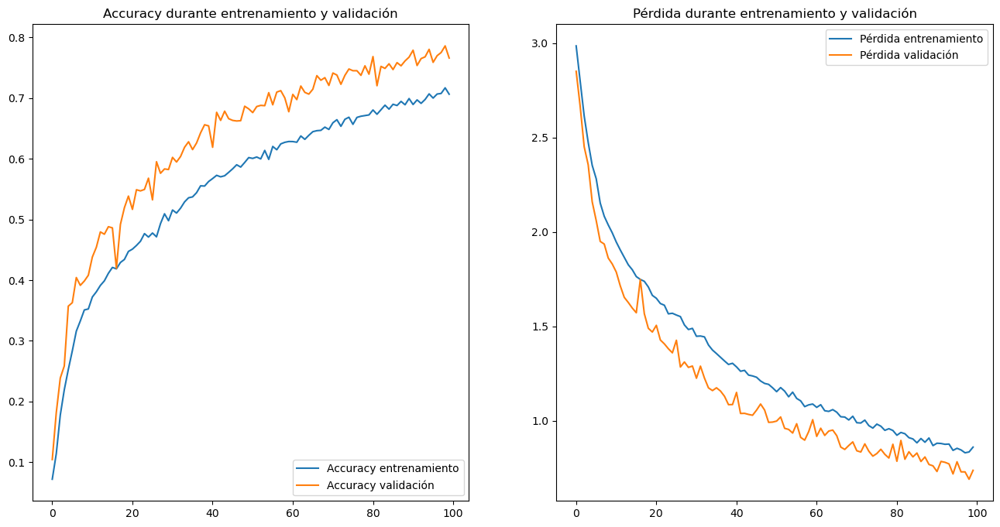

In [57]:
# Plot del training loss i l'accuracy
mostrar_graficas(entrenamiento_CNN)

In [40]:
#Información del modelo
modelo_CNN.summary() 

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 224, 224, 16)      1216      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 112, 112, 16)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 56, 56, 32)       0         
 2D)                                                       

In [59]:
# Estadísticas y resultados del modelo 
test_loss, test_acc = modelo_CNN.evaluate(test_data)

print("\nTiempo de entrenamiento:", end_time - start_time)
print('Pérdida en el conjunto de test:', test_loss)
print('Precisión en el conjunto de test:', test_acc)

33/33 [==============================] - 3s 66ms/step - loss: 0.7314 - accuracy: 0.7562

Tiempo de entrenamiento: 2858.381495952606
Pérdida en el conjunto de test: 0.7313904762268066
Precisión en el conjunto de test: 0.7561904788017273


<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Las respuestas a las preguntas planteadas son:

* ¿Cúal es el número de parámetros a entrenar?  29,877
* ¿Y el tiempo de entrenamiento? El tiempo total de entrenamiento ha sido aproximadamente de 47 minutos
* ¿Qué precisión se obtiene con este modelo? 75,6%
    
Como se puede comprobar la precisión del modelo mucho mayor que el modelo anterior, esto se debe a todas las mejoras de este modelo (esta precisión se puede ver también de una manera visual y numérica). Por otro lado el número de parámetros ha sido menor que en el modelo anterior.
<br><br>
</div>

## 4. Autoencoders (2 puntos)

En el apartado anterior hemos podido observar que, utilizando el tipo de redes adecuado, podemos obtener mejores resultados entrenando un número de parámetros muy inferior. Esto es debido a que las CNN consiguen extraer las características principales de los datos proporcionados (imágenes en nuestro caso).

En este apartado vamos a observar esta capacidad desde otro punto de vista: el de **codificar y decodificar una imagen**.

Para ello diseñaremos un autoencoder que sea capaz de reducir el tamaño de los datos de entrada pero captando las características principales de las imágenes para poder llevar a cabo una buena reconstrucción de las mismas.

Empezaremos rescalando externamente los datos que vamos a utilizar, para que estén en el rango (0,1), en lugar de realizarlo dentro de la red como hemos hecho en el apartado anterior:

In [60]:
# data rescalling
normalization_layer = Rescaling(1./255)

normalized_train_data = train_data.map(lambda x, y: (normalization_layer(x), y))
normalized_val_data = val_data.map(lambda x, y: (normalization_layer(x), y))

Además, en un autoencoder, en lugar de utilizar las etiquetas como objetivo (que es lo que se utiliza en un problema de clasificación), deben ser las propias imágenes las que se utilicen como objetivo de la red. Por tanto, crearemos una nueva base de datos de entrenamiento y validación donde son las propias imágenes las que hagan de etiquetas:

In [61]:
train_data_auto = normalized_train_data.map(lambda x, y: (x, x))
val_data_auto = normalized_val_data.map(lambda x, y: (x, x))

Comprobamos la estructura de la nueva base de datos:

In [62]:
image_batch, label_batch = iter(train_data_auto).get_next()
print("Las dimensiones de un batch de imágenes es: {}".format(image_batch.shape))
print("Las dimensiones de un batch de etiquetas es: {}".format(label_batch.shape))

Las dimensiones de un batch de imágenes es: (32, 224, 224, 3)
Las dimensiones de un batch de etiquetas es: (32, 224, 224, 3)


Y que los datos tienen el rango dinámico adecuado:

In [63]:
first_image = image_batch[0]
print("En la primera imagen los valores mínimo y máximo son {} y {}, respectivamente"
      .format(np.min(first_image),np.max(first_image)))

En la primera imagen los valores mínimo y máximo son 0.04708659648895264 y 0.9444637298583984, respectivamente


### 4.1. Diseño y entrenamiento del autoencoder

Una vez ya tenemos los datos en el formato adecuado vamos a diseñar el autoencoder. Para ello utilizaremos el bloque extractor del apartado anterior como codificador y reflejaremos su estructura en el decodificador utilizando las capas [Conv2DTranspose](https://keras.io/api/layers/convolution_layers/convolution2d_transpose/) y [UpSampling2D](https://keras.io/api/layers/reshaping_layers/up_sampling2d/) de keras.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
    <strong>Ejercicio [1 punto]:</strong> A partir del modelo <strong>funcional</strong> de keras (y la clase <code>Model()</code>), implementa un autoencoder con las siguientes características:
    <ul>
        <li>El bloque codificador debe tener:
            <ul>
                <li>Una capa de entrada de dimensiones adecuadas a los datos.</li>
                <li>3 capas convolucionales con tamaño de kernel (5x5) para la primera y (3x3) para las 2 siguientes. Se utilizará padding '<i>same</i>' y activación ReLU. El número de filtros para cada capa convolucional será 16, 32 y 64 respectivamente.</li>
                <li>A cada capa convolucional le sigue una capa de <i>Max Pooling</i></li>
            </ul></li>
        <li>El bloque decodificador debe tener:
            <ul>
                <li>3 capas convolucionales con tamaño de kernel (3x3) para las 2 primeras y (5x5) para la última. Se utilizará padding '<i>same</i>' y activación ReLU. El número de filtros para cada capa convolucional será 64, 32 y 16, respectivamente</li>
                <li>A cada capa convolucional le sigue una capa de <i>UpSampling2D</i></li>
                <li>Una última capa convolucional con tamaño de kernel (3x3), con 3 filtros y activación sigmoide.</li>
            </ul></li>
    </ul>
    
Compilar y entrenar el modelo siguiendo las siguientes indicaciones:
     <ul>
         <li>Utilizar el optimizador Adam con  <i>learning rate</i> de 0.001.</li>
         <li>Utilizar como función de pérdida el error cuadrático medio.</li>
         <li>Entrenar durante 100 épocas utilizando  <i>EarlyStopping</i> con una persistencia de 10 épocas, monitorizando la función de pérdida en el conjunto de validación, y guardando los pesos que mejor resultado hayan obtenido.</li>
         <li>Monitorizar la pérdida durante entrenamiento y validación.</li>
         <li>Mostrar las gráficas del <i>loss</i> (la curva de entrenamiento y la de validación).</li>
    </ul>
</div>



In [41]:
# Definición de la red

# Entrada
input_image = layers.Input(shape=(224, 224, 3))

# Capas convolucionales del codificador
## Capa 1
conv_1 = Conv2D(16, (5, 5), padding='same', activation='relu')(input_image)
pool_1 = MaxPooling2D((2, 2), padding='same')(conv_1)
## Capa 2
conv_2 = Conv2D(32, (3, 3), padding='same', activation='relu')(pool_1)
pool_2 = MaxPooling2D((2, 2), padding='same')(conv_2)
## Capa 3
conv_3 = Conv2D(64, (3, 3), padding='same', activation='relu')(pool_2)
encoder_output = MaxPooling2D((2, 2), padding='same')(conv_3)

# Capas convolucionales del decodificador
## Capa 1
deconv_1 = Conv2DTranspose(64, (3, 3), padding='same', activation='relu')(encoder_output)
upsample_1 = UpSampling2D((2, 2))(deconv_1)
## Capa 2
deconv_2 = Conv2DTranspose(32, (3, 3), padding='same', activation='relu')(upsample_1)
upsample_2 = UpSampling2D((2, 2))(deconv_2)
## Capa 3
deconv_3 = Conv2DTranspose(16, (5, 5), padding='same', activation='relu')(upsample_2)
upsample_3 = UpSampling2D((2, 2))(deconv_3)

decoder_output = Conv2DTranspose(3, (3, 3), padding='same', activation='sigmoid')(upsample_3)

# Definir modelo completo
modelo_autoencoder = Model(input_image, decoder_output)

In [65]:
# Compilación de la red
optimizer = Adam(learning_rate=0.001)
modelo_autoencoder.compile(optimizer=optimizer, metrics=['accuracy'], loss='mean_squared_error')

In [66]:
# Definir EarlyStopping y ModelCheckpoint
early_stopping =  tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, mode='min')
checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min')

In [67]:
# Entrenamiento de la red
start_time = time.time()
entrenamiento_autoencoder = modelo_autoencoder.fit(train_data_auto, 
                                          epochs=100, 
                                          validation_data=val_data_auto,
                                          callbacks=[early_stopping, checkpoint])
end_time = time.time()

Epoch 1/100
230/230 [==============================] - 31s 127ms/step - loss: 0.0151 - accuracy: 0.4605 - val_loss: 0.0067 - val_accuracy: 0.5416
Epoch 2/100
230/230 [==============================] - 31s 132ms/step - loss: 0.0061 - accuracy: 0.5985 - val_loss: 0.0051 - val_accuracy: 0.6712
Epoch 3/100
230/230 [==============================] - 35s 149ms/step - loss: 0.0049 - accuracy: 0.6816 - val_loss: 0.0048 - val_accuracy: 0.6914
Epoch 4/100
230/230 [==============================] - 30s 127ms/step - loss: 0.0044 - accuracy: 0.6949 - val_loss: 0.0040 - val_accuracy: 0.6817
Epoch 5/100
230/230 [==============================] - 30s 126ms/step - loss: 0.0040 - accuracy: 0.7024 - val_loss: 0.0039 - val_accuracy: 0.7079
Epoch 6/100
230/230 [==============================] - 28s 119ms/step - loss: 0.0038 - accuracy: 0.7041 - val_loss: 0.0035 - val_accuracy: 0.7005
Epoch 7/100
230/230 [==============================] - 29s 122ms/step - loss: 0.0037 - accuracy: 0.7035 - val_loss: 0.0033 -

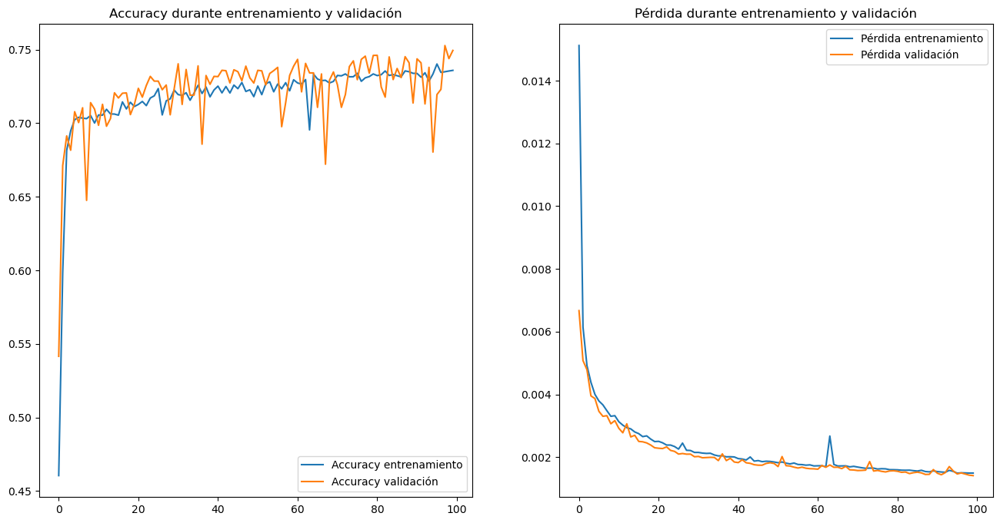

In [68]:
# Representación del loss
mostrar_graficas(entrenamiento_autoencoder)

### 4.2. Evaluación del autoencoder

La evaluación del modelo obtenido puede hacerse en este caso tanto de forma cuantitativa (calculando el MSE entre las imágenes originales y reconstruídas del conjunto de test) como cualitativa (mostrando imágenes originales y reconstruídas).

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
    <strong>Ejercicio [1 punto]:</strong> Realizar las siguientes operaciones para evaluar las prestaciones del modelo obtenido:
    <ul>
        <li>Partiendo del conjunto de test obtenido en el primer apartado de la practica:
            <ul>
                <li>Llevar a cabo el reescalado de los datos utilizando la capa <code>normalization_layer</code> tal y como se ha hecho con los conjuntos de entrenamiento y test al inicio de este bloque.</li>
                <li>Generar el conjunto de datos <code>test_data_auto</code> en el que las imágenes sean también el objetivo y substituyan a las etiquetas. </li>
            </ul></li>
        <li>Realizar la evaluación del modelo una vez ha finalizado el entrenamiento para mostrar la pérdida y la precisión final a partir de los datos de test.</li>
        <li>Imprimir por pantalla 4 parejas de imágenes (original y reconstruída). Nota: a la hora de representar las imágenes correctamente, recordad que su rango dinámico deben ser números enteros entre 0 y 255.</li>
    </ul>
    Preguntas: ¿Consideras que la reconstrucción es adecuada? ¿Qué <i>ratio</i> de compresión se consigue con este autoencoder? Consideramos como <i>ratio</i> de compresión la relación entre el tamaño original de la imagen (224,224,3) y el de la representación más perqueña que llega a hacer el codificador (tamaño de la salida de su última capa).

In [69]:
# Normalización de los datos
normalization_layer = Rescaling(1./255)
normalized_test_data = test_data.map(lambda x, y: (normalization_layer(x), y))
test_data_auto = normalized_test_data.map(lambda x, y: (x, x))
image_batch, label_batch = iter(test_data_auto).get_next()
print("Las dimensiones de un batch de imágenes es: {}".format(image_batch.shape))
print("Las dimensiones de un batch de etiquetas es: {}".format(label_batch.shape))
first_image = image_batch[0]
print("En la primera imagen los valores mínimo y máximo son {} y {}, respectivamente"
      .format(np.min(first_image),np.max(first_image)))

Las dimensiones de un batch de imágenes es: (32, 224, 224, 3)
Las dimensiones de un batch de etiquetas es: (32, 224, 224, 3)
En la primera imagen los valores mínimo y máximo son 0.6426967978477478 y 0.9833736419677734, respectivamente


In [70]:
# Evaluación del modelo
test_loss, test_acc = modelo_autoencoder.evaluate(test_data_auto)

print("\nTiempo de entrenamiento:", end_time - start_time)
print('Pérdida en el conjunto de test:', test_loss)
print('Precisión en el conjunto de test:', test_acc)

33/33 [==============================] - 3s 79ms/step - loss: 0.0014 - accuracy: 0.7513

Tiempo de entrenamiento: 3535.9279289245605
Pérdida en el conjunto de test: 0.0014285397483035922
Precisión en el conjunto de test: 0.7512709498405457


1/1 [==============================] - 0s 29ms/step


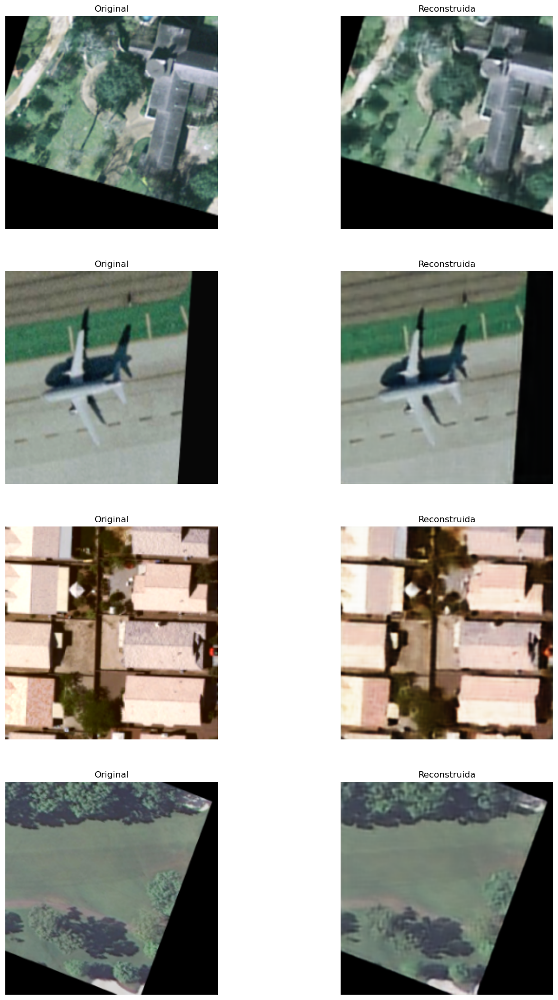

In [71]:
# Visualización de los datos

n = 4  # número de parejas de imágenes a mostrar
plt.figure(figsize=(15, 6*n))
for i, (image, label) in enumerate(test_data_auto.take(n)):
    # imagen original
    ax = plt.subplot(n, 2, 2*i+1)
    plt.imshow(np.array(image[0]* 255, dtype=int))
    plt.title('Original')
    plt.axis('off')
    # imagen reconstruida
    ax = plt.subplot(n, 2, 2*i+2)
    reconstructed = modelo_autoencoder.predict(image)[0]
    plt.imshow(np.array(reconstructed* 255, dtype=int))
    plt.title('Reconstruida')
    plt.axis('off')
plt.show()

<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Las respuestas a las preguntas planteadas son:

* ¿Consideras que la reconstrucción es adecuada? Si, tenemos una precisión del 75,12% y a nivel visual se muestra bastante parecida la imagen reconstruida de la original. Por lo que considero que la reconstrucción es adecuada.
* ¿Qué <i>ratio</i> de compresión se consigue con este autoencoder?  Si la entrada tiene una dimensión de 224x224x3, y la capa de salida del codificador tiene una dimensión de 28x28x64, entonces el ratio de compresión sería: (224 * 224 * 3) / (28 * 28 * 64) = 37.29
<br><br>
</div>

## 5. Red VGG16 y transfer learning (2 puntos)

Las redes neuronales convolucionales profundas nos brindan la posibilidad de mejorar la capacidad de aprendizaje de un modelo. Algunas arquitecturas comunes, pueden incluir cientos de capas convolucionales. No obstante, entrenar estas arquitecturas desde cero puede resultar costoso tanto en términos de tiempo como de recursos, además de requerir conjuntos de datos bastante grandes.

### 5.1. Transfer Learning
En este apartado, aplicaremos [transfer learning](https://keras.io/guides/transfer_learning/) con el fin de ahorrarnos parte de dicho entrenamiento. Esta metodología consiste en aprovechar los pesos de un modelo entrenado en otra base de datos y para otra tarea. En concreto, utilizaremos el modelo [VGG16](https://keras.io/api/applications/vgg/#vgg16-function) preentrenado en [Imagenet](http://www.image-net.org/), y lo adaptaremos para clasificar las 21 categorías de nuestra base de datos. En la versión de VGG16 de keras existe la opción de cargar los pesos entrenados en Imagenet sin las 3 capas totalmente conectadas de la parte final de la red (opción <code>include_top = False</code>), nosotros substituiremos esas 3 capas y reentrenaremos el conjunto con el resto de pesos congelados.

Para reutilizar el modelo correctamente es necesario preprocesar los datos tal y como se hizo durante el entrenamiento en la base de datos original. Keras nos facilita aplicar la normalización en el caso de modelos preentrenados; para el caso de VGG16 revisar la documentación de [prepocess_input](https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg16/preprocess_input) (tened en cuenta que la función se aplica sobre imágenes con rango dinámico de 0 a 255).


<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
<strong>Ejercicio[1 punto]:</strong> Implementa una red siguiendo los siguientes pasos:
    <ul>
        <li>Partir del modelo VGG16 con los pesos entrenados en Imagenet y congelarlos</li>
        <li>Substituir las 3 últimas capas completamente conectadas por 3 capas nuevas: las 2 primeras de 50 y 20 neuronas respectivamente con activación ReLU, y una última capa con el número de neuronas adecuado para llevar a cabo la tarea de clasificación sobre nuestra base de datos y la función de activación adecuada.</li> 
    </ul>
Compilar y entrenar el modelo siguiendo las siguientes indicaciones:
     <ul>
         <li>Utilizar el optimizador Adam con  <i>learning rate</i> de 0.0001.</li>
         <li>Entrenar durante 100 épocas utilizando  <i>EarlyStopping</i> con una persistencia de 10 épocas, monitorizando la <i>accuracy</i> en el conjunto de validación, y guardando los pesos que mejor resultado hayan obtenido.</li>
         <li>Monitorear la métrica  <i>accuracy</i> durante entrenamiento y validación.</li>
         <li>Mostrar las gráficas de accuracy y loss. En cada gráfica debe visualizarse la curva de entrenamiento y la de validación.</li>
         <li>Realizar la evaluación del modelo una vez ha finalizado el entrenamiento para mostrar la pérdida y la precisión final a partir de los datos de test.</li>
    </ul>
    Preguntas a responder: ¿Cúal es el número de parámetros a entrenar? ¿y el tiempo de entrenamiento? ¿Qué precisión se obtiene con este modelo? Comenta los resultados.
</div>

In [16]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Loading VGG16 model
vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in vgg.layers:
    layer.trainable = False

58889256/58889256 [==============================] - 4s 0us/step


In [17]:
# Definición de la red

# Substituir últimas capas completamente conectadas
flatten = Flatten()(vgg.output)
fc1 = Dense(50, activation='relu')(flatten)
fc2 = Dense(20, activation='relu')(fc1)
output = Dense(21, activation='softmax')(fc2)

# Crear modelo
modelo_VGG = Model(inputs=vgg.input, outputs=output)

In [18]:
# Compilación de la red
opt = Adam(learning_rate=0.0001)
modelo_VGG.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [19]:
# Definir EarlyStopping y ModelCheckpoint
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, verbose=1)
best_model = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True, verbose=1)

In [20]:
# Entrenamiento de la red
start_time = time.time()
entrenamiento_VGG = modelo_VGG.fit(train_data, epochs=100, validation_data=val_data, callbacks=[early_stop, best_model])
end_time = time.time()

Epoch 1/100
230/230 [==============================] - ETA: 0s - loss: 2.6452 - accuracy: 0.3216
Epoch 1: val_accuracy improved from -inf to 0.55667, saving model to best_model.h5
230/230 [==============================] - 35s 134ms/step - loss: 2.6452 - accuracy: 0.3216 - val_loss: 1.5963 - val_accuracy: 0.5567
Epoch 2/100
230/230 [==============================] - ETA: 0s - loss: 0.8850 - accuracy: 0.7320
Epoch 2: val_accuracy improved from 0.55667 to 0.70857, saving model to best_model.h5
230/230 [==============================] - 28s 118ms/step - loss: 0.8850 - accuracy: 0.7320 - val_loss: 1.0719 - val_accuracy: 0.7086
Epoch 3/100
230/230 [==============================] - ETA: 0s - loss: 0.3207 - accuracy: 0.9093
Epoch 3: val_accuracy improved from 0.70857 to 0.75857, saving model to best_model.h5
230/230 [==============================] - 27s 115ms/step - loss: 0.3207 - accuracy: 0.9093 - val_loss: 0.9419 - val_accuracy: 0.7586
Epoch 4/100
230/230 [==============================]

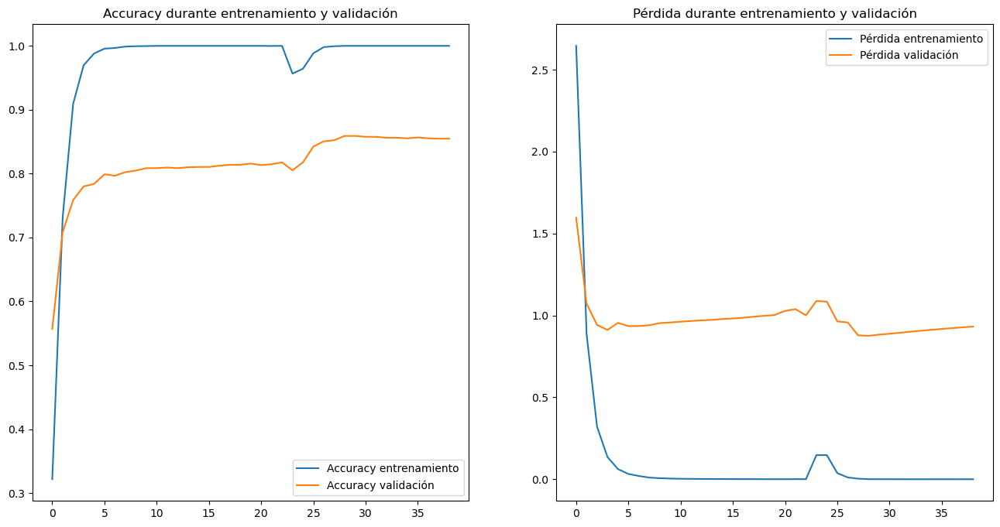

In [21]:
# Representación del loss
mostrar_graficas(entrenamiento_VGG)

In [22]:
#Información del modelo
modelo_VGG.summary() 

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [23]:
# Resultados
test_loss, test_acc = modelo_VGG.evaluate(test_data)

print("\nTiempo de entrenamiento:",end_time - start_time)
print('Pérdida en el conjunto de test:', test_loss)
print('Precisión en el conjunto de test:', test_acc)

33/33 [==============================] - 8s 190ms/step - loss: 1.0031 - accuracy: 0.8610

Tiempo de entrenamiento: 1248.644618988037
Pérdida en el conjunto de test: 1.0031335353851318
Precisión en el conjunto de test: 0.8609523773193359


<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Las respuestas a las preguntas planteadas son:

* ¿Cúal es el número de parámetros a entrenar?  15,970,599
* ¿Y el tiempo de entrenamiento? El tiempo total de entrenamiento ha sido aproximadamente de 21 minutos
* ¿Qué precisión se obtiene con este modelo? 86%
    
Como se puede comprobar la precisión del modelo es muy superior a la de los modelos anteriores por lo que la tranferencia de conocimiento puede ser bastante util para este tipo de casos.
<br><br>
</div>

### 5.2. Fine-tunning
Una técnica frecuente, sobretodo cuando la red utilizada no es excesivamente grande (como es el caso de VGG16), para mejorar los resultados del <i>transfer learning</i> es el denominado <i>fine-tunning</i>,  que consiste en reentrenar la red completa durante unas pocas épocas y con un <i>learning rate</i> muy pequeño.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
<strong>Ejercicio[1 punto]:</strong> Volver a compilar el modelo con los siguientes cambios:
    <ul>
        <li>Descongelar los pesos del modelo VGG16 poniendo <code>trainable=False</code> (no confundir con <code>traning=False</code>).</li>
    </ul>
Compilar y entrenar el modelo siguiendo las siguientes indicaciones:
     <ul>
         <li>Utilizar el optimizador Adam con  <i>learning rate</i> de 0.00001.</li>
         <li>Entrenar durante 10 épocas utilizando  <i>EarlyStopping</i> con una persistencia de 10 épocas monitorizando la <i>accuracy</i> en el conjunto de validación, y guardando los pesos que mejor resultado hayan obtenido.</li>
         <li>Monitorizar la métrica  <i>accuracy</i> durante entrenamiento y validación.</li>
         <li>Mostrar las gráficas de accuracy y loss. En cada gráfica debe visualizarse la curva de entrenamiento y la de validación.</li>
         <li>Realizar la evaluación del modelo una vez ha finalizado el entrenamiento para mostrar la pérdida y la precisión final a partir de los datos de test.</li>
    </ul>
    Preguntas a responder: ¿Cúal es el número de parámetros a entrenar? ¿y el tiempo de entrenamiento? ¿Qué precisión se obtiene con este modelo? Comenta los resultados teniendo en cuenta el proceso global: <i>transfer lerning</i> + <i> fine-tunning</i>.
</div>


In [25]:
# Definición del modelo
modelo_VGG16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Congelamos los pesos del modelo
for layer in modelo_VGG16.layers:
    layer.trainable = True

new_modelo_VGG16 = Sequential()
new_modelo_VGG16.add(modelo_VGG16)
new_modelo_VGG16.add(Flatten())
new_modelo_VGG16.add(Dense(50, activation='relu'))
new_modelo_VGG16.add(Dense(20, activation='relu'))
new_modelo_VGG16.add(Dense(21, activation='softmax'))

In [26]:
# Compilación de la red
optimizer = Adam(learning_rate=0.00001)
new_modelo_VGG16.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [27]:
# Definir EarlyStopping y ModelCheckpoint
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, verbose=1)
checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model_ft.h5', monitor='val_accuracy', save_best_only=True, verbose=1)

In [28]:
# Entrenamiento
start_time = time.time()
entrenamiento_new_modelo_VGG16 = new_modelo_VGG16.fit(train_data, 
                                                      epochs=10, 
                                                      validation_data=val_data, 
                                                      callbacks=[early_stopping, checkpoint], 
                                                      verbose=1)
end_time = time.time()

Epoch 1/10
230/230 [==============================] - ETA: 0s - loss: 3.1590 - accuracy: 0.1072
Epoch 1: val_accuracy improved from -inf to 0.21810, saving model to best_model_ft.h5
230/230 [==============================] - 58s 240ms/step - loss: 3.1590 - accuracy: 0.1072 - val_loss: 2.6392 - val_accuracy: 0.2181
Epoch 2/10
230/230 [==============================] - ETA: 0s - loss: 2.2931 - accuracy: 0.3120
Epoch 2: val_accuracy improved from 0.21810 to 0.40667, saving model to best_model_ft.h5
230/230 [==============================] - 55s 237ms/step - loss: 2.2931 - accuracy: 0.3120 - val_loss: 1.9386 - val_accuracy: 0.4067
Epoch 3/10
230/230 [==============================] - ETA: 0s - loss: 1.3795 - accuracy: 0.5830
Epoch 3: val_accuracy improved from 0.40667 to 0.65762, saving model to best_model_ft.h5
230/230 [==============================] - 56s 240ms/step - loss: 1.3795 - accuracy: 0.5830 - val_loss: 1.1671 - val_accuracy: 0.6576
Epoch 4/10
230/230 [==========================

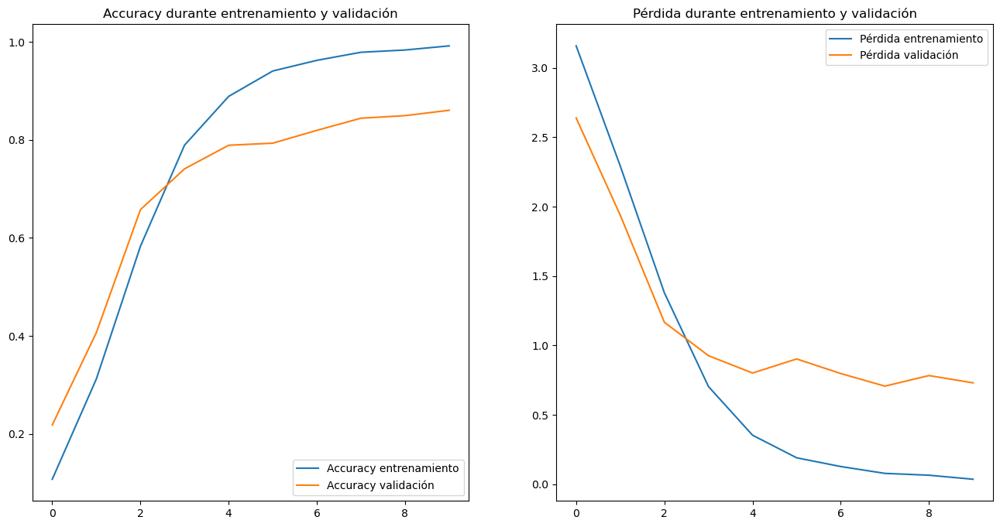

In [29]:
# Representación del loss
mostrar_graficas(entrenamiento_new_modelo_VGG16)

In [30]:
#Información del modelo
new_modelo_VGG16.summary() 

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 dense_8 (Dense)             (None, 50)                1254450   
                                                                 
 dense_9 (Dense)             (None, 20)                1020      
                                                                 
 dense_10 (Dense)            (None, 21)                441       
                                                                 
Total params: 15,970,599
Trainable params: 15,970,599
Non-trainable params: 0
_________________________________________________________________


In [31]:
# Resultados
test_loss, test_acc = new_modelo_VGG16.evaluate(test_data)

print("\nTiempo de entrenamiento:", end_time - start_time)
print('Pérdida en el conjunto de test:', test_loss)
print('Precisión en el conjunto de test:', test_acc)

33/33 [==============================] - 4s 94ms/step - loss: 0.8095 - accuracy: 0.8543

Tiempo de entrenamiento: 717.4674685001373
Pérdida en el conjunto de test: 0.8094838857650757
Precisión en el conjunto de test: 0.854285717010498


<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Las respuestas a las preguntas planteadas son:

* ¿Cúal es el número de parámetros a entrenar?  15,970,599
* ¿Y el tiempo de entrenamiento? El tiempo total de entrenamiento ha sido aproximadamente de 12 minutos
* ¿Qué precisión se obtiene con este modelo? 85,4%
    
Teniendo en cuenta el proceso global de transfer learning y fine-tuning, podemos observar que este método suele ser efectivo para problemas de análisis de imágenes, viendo que tenemos una precisión bastante mayor que el resto de metodos, y que en los dos casos que hemos realizado, la precisión no ha variado mucho, pero siempre ha sido mejor que los otros casos.
<br><br>
</div>

## 6. Mejora de resultados (1 punto)

En este último apartado se deja libertad al alumno para conseguir, mediante el diseño de una red propia, unos mejores resultados en la tarea de clasificación.

Se valorarará la justificación de las elecciones realizadas.

<div style="background-color: #EDF7FF; border-color: #7C9DBF; border-left: 5px solid #7C9DBF; padding: 0.5em;">
<strong>Ejercicio[1 punto]:</strong> Implementar un modelo para llevar a cabo la tarea de clasificación:
    <ul>
        <li>Diseñar la arquitectura de la red</li>
        <li>Compilar el modelo</li>
        <li>Llevar a cabo el entrenamientio</li>
        <li>Evaluar el modelo presentando las métricas y gráficas adecuadas</li>
        <li>Comentar los resultados obtenidos</li>
    </ul>
</div>

In [6]:
# Dimensiones de entrada de los datos
input_shape = (224, 224, 3)

# Capa de entrada
input_layer = Input(shape=input_shape)

# Capa de rescalado
rescale_layer = Rescaling(scale=1./255)(input_layer)

# Bloque extractor de características

## Capa 1
conv1_layer = Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu')(rescale_layer)
conv2_layer = Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu')(conv1_layer)
pool1_layer = MaxPooling2D(pool_size=(2, 2))(conv2_layer)

## Capa 2
conv3_layer = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu')(pool1_layer)
conv4_layer = Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu')(conv3_layer)
pool2_layer = MaxPooling2D(pool_size=(2, 2))(conv4_layer)

## Capa 3
conv5_layer = Conv2D(filters=128, kernel_size=(3, 3), padding='same', activation='relu')(pool2_layer)
conv6_layer = Conv2D(filters=128, kernel_size=(3, 3), padding='same', activation='relu')(conv5_layer)
pool3_layer = MaxPooling2D(pool_size=(2, 2))(conv6_layer)

## Capa Global
global_pool_layer = GlobalAveragePooling2D()(pool3_layer)

# Clasificador final
dense1_layer = Dense(units=512, activation='relu')(global_pool_layer)
dropout_layer = Dropout(rate=0.5)(dense1_layer)

output_layer = Dense(units=21, activation='softmax')(dropout_layer)

# Crear modelo
modelo_final = Model(inputs=input_layer, outputs=output_layer)

In [7]:
# Compilar el modelo
modelo_final.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [8]:
# Definir EarlyStopping y ModelCheckpoint
early_stopping =  tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, verbose=1)
checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)

In [9]:
# Entrenar el modelo
start_time = time.time()
entrenamiento_modelo_final = modelo_final.fit(train_data, 
                                              epochs=100, 
                                              validation_data=val_data, 
                                              callbacks=[early_stopping, checkpoint])
end_time = time.time()

Epoch 1/100
230/230 [==============================] - ETA: 0s - loss: 3.0299 - accuracy: 0.0468
Epoch 1: val_loss improved from inf to 2.95095, saving model to best_model.h5
230/230 [==============================] - 50s 173ms/step - loss: 3.0299 - accuracy: 0.0468 - val_loss: 2.9509 - val_accuracy: 0.0767
Epoch 2/100
229/230 [============================>.] - ETA: 0s - loss: 2.6319 - accuracy: 0.1344
Epoch 2: val_loss improved from 2.95095 to 2.29867, saving model to best_model.h5
230/230 [==============================] - 30s 126ms/step - loss: 2.6317 - accuracy: 0.1350 - val_loss: 2.2987 - val_accuracy: 0.2367
Epoch 3/100
229/230 [============================>.] - ETA: 0s - loss: 2.1523 - accuracy: 0.2612
Epoch 3: val_loss improved from 2.29867 to 1.87961, saving model to best_model.h5
230/230 [==============================] - 28s 119ms/step - loss: 2.1512 - accuracy: 0.2614 - val_loss: 1.8796 - val_accuracy: 0.3843
Epoch 4/100
229/230 [============================>.] - ETA: 0s - 

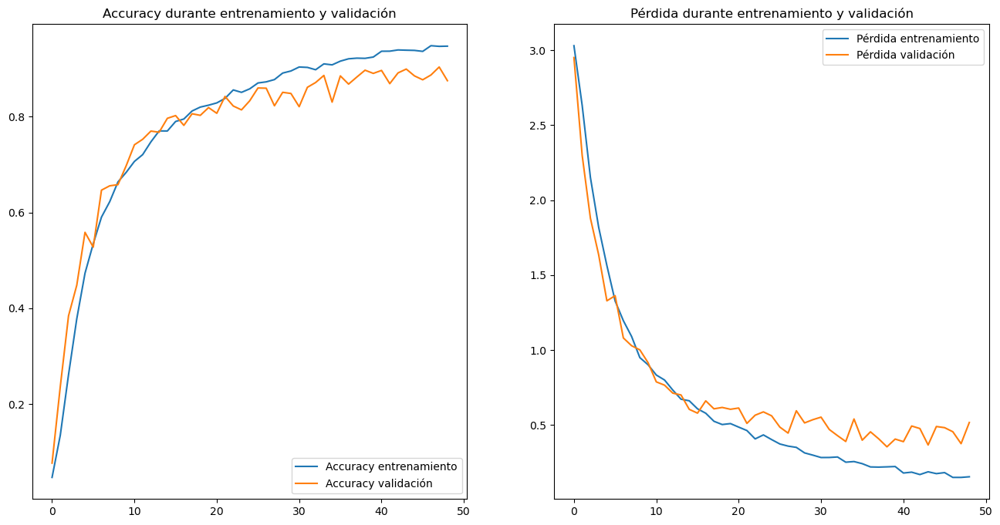

In [12]:
# Representación del loss
mostrar_graficas(entrenamiento_modelo_final)

In [13]:
#Información del modelo
modelo_final.summary() 

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 64)      18496     
                                                             

In [14]:
# Estadísticas y resultados del modelo 
test_loss, test_acc = modelo_final.evaluate(test_data)

print("\nTiempo de entrenamiento:", end_time - start_time)
print('Pérdida en el conjunto de test:', test_loss)
print('Precisión en el conjunto de test:', test_acc)

33/33 [==============================] - 6s 132ms/step - loss: 0.4912 - accuracy: 0.8695

Tiempo de entrenamiento: 1600.0847635269165
Pérdida en el conjunto de test: 0.491167813539505
Precisión en el conjunto de test: 0.869523823261261


<div style="background-color: #fcf2f2; border-color: #dfb5b4; border-left: 5px solid #dfb5b4; padding: 0.5em;">
<strong>Comentarios:</strong>
<br><br>
Para diseñar una red neuronal que mejore los resultados de clasificación de las redes anteriores, se propone la siguiente arquitectura:

* Capa de entrada con rescalado de los datos de entrada.

* Bloque extractor de características:

* 2 capas convolucionales con kernel de (3,3), activación ReLU y padding 'same', seguidas de una capa de pooling de (2,2). Este bloque se repite tres veces para aumentar la profundidad de la red.
    
* Capa global de pooling para reducir la dimensionalidad de las características extraídas.

* Capa completamente conectada con 512 neuronas y activación ReLU.

* Capa de dropout con una tasa del 50%.

* Capa de salida con activación softmax y 21 unidades, correspondientes a las 21 clases del conjunto de datos.
    
* Se ha utilizado la función de activación 'softmax' en la capa de salida y la pérdida 'sparse_categorical_crossentropy' en la compilación del modelo. El optimizador utilizado ha sido Adam con un learning rate de 0.0001.

* Se ha entrenado el modelo durante 100 épocas utilizando EarlyStopping con una persistencia de 10 épocas, monitorizando la accuracy en el conjunto de validación, y guardando los pesos que mejor resultado hayan obtenido. Se ha monitorizado la métrica accuracy durante entrenamiento y validación.
    
Los resultados obtenidos han sido:

* El número de parámetros a entrenar en esta red propia es de 363,829.

* El tiempo de entrenamiento ha sido de 26 minutos aproximadamente.

* Los resultados obtenidos han sido muy buenos, con una precisión final del 86,95% sobre el conjunto de test, superando al resto de modelos planteados anteriormente.
<br><br>
</div>